# PGIR22akgylf in TESS Sectors 74 and 75

This notebook tests whether the **0.1802-day modulation** seen during Sector 55, or its **0.3604-day double period**, is present in Sectors 74 and 75.

The analysis deliberately treats the nearby eclipsing binary **ATO J300.1356+34.8776** as a contaminant:

1. download 12×12-pixel TESSCut target pixel files for Sectors 74 and 75;
2. extract the nova, local background, and an eclipsing-binary proxy with the same square-aperture method used for Sector 55;
3. bin the native 200-second observations to an exact 10-minute cadence, matching Sector 55;
4. apply the Sector 55 sequence: 3σ clipping, 101-point fifth-order Savitzky–Golay subtraction, a second 3σ clip, and a Lomb–Scargle search over 0.05–3 days;
5. measure the eclipsing-binary period in each sector and subtract a four-harmonic model of that signal from the nova aperture;
6. repeat the period search and produce fixed-period phase plots at 0.1802 and 0.3604 days;
7. analyze each sector separately and the cleaned Sectors 74+75 lightcurve together.

The harmonic subtraction removes only frequencies tied to the measured eclipsing-binary period. This reduces the risk of fitting away an independent signal near 0.1802 days. All plots are written to `pgir22akgylf_sectors74_75_period_search/` as PNG and EPS files.

In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy.time import Time
from IPython.display import display
from scipy.signal import savgol_filter
import lightkurve as lk

# Repository plotting preference: never draw background grids.
plt.rcParams.update({
    "axes.grid": False,
    "figure.figsize": (10, 6),
    "figure.dpi": 110,
    "savefig.bbox": "tight",
})

print(f"Lightkurve {lk.__version__}")

Lightkurve 2.6.0


/home/kirx/current_work/PGIR/rerun_lk/PGIR22akgylf_lightkurve/.venv/lib/python3.12/site-packages/lightkurve/prf/__init__.py:7: UserWarning: Warning: the tpfmodel submodule is not available without oktopus installed, which requires a current version of autograd. See #1452 for details.
  warnings.warn(


## Configuration and exact 10-minute cadence

In [2]:
TARGET_NAME = "PGIR22akgylf"
TARGET_COORD = SkyCoord("20:00:29.254 +34:53:09.17", unit=(u.hourangle, u.deg))
EB_NAME = "ATO J300.1356+34.8776"
EB_COORD = SkyCoord("20:00:32.5503041 +34:52:39.529398", unit=(u.hourangle, u.deg))

SECTORS = (74, 75)
CUTOUT_SIZE = 12
PERIOD_RANGE = (0.05, 3.0) * u.day
NOVA_PERIOD = 0.1802 * u.day
DOUBLE_PERIOD = 2 * NOVA_PERIOD
EB_PERIOD_HINT = 0.1987 * u.day
EB_SEARCH_RANGE = (0.15, 0.25) * u.day
SAVGOL_WINDOW = 101
SAVGOL_POLYORDER = 5
EB_HARMONICS = 4

OUTPUT_DIR = Path("pgir22akgylf_sectors74_75_period_search")
DOWNLOAD_DIR = Path("tesscut_cache")
OUTPUT_DIR.mkdir(exist_ok=True)
DOWNLOAD_DIR.mkdir(exist_ok=True)

# Use a simple, exact 10-minute bin width.
REFERENCE_CADENCE = 10 * u.min

print(f"Cadence used for binning: {REFERENCE_CADENCE.to_value(u.min):.1f} minutes")
print(f"Candidate periods: {NOVA_PERIOD.value:.4f} and {DOUBLE_PERIOD.value:.4f} days")
print(f"Eclipsing-binary reference period: {EB_PERIOD_HINT.value:.4f} days")

Cadence used for binning: 10.0 minutes
Candidate periods: 0.1802 and 0.3604 days
Eclipsing-binary reference period: 0.1987 days


## Aperture extraction, matched-cadence binning, and plotting helpers

In [3]:
def save_figure(fig, stem):
    """Save one diagnostic figure in the same PNG/EPS formats as the Sector 55 notebook."""
    fig.savefig(OUTPUT_DIR / f"{stem}.png", dpi=300)
    fig.savefig(OUTPUT_DIR / f"{stem}.eps", format="eps")


def pixel_center(tpf, coord):
    """Return the nearest local cutout pixel for a sky coordinate as (x, y)."""
    x, y = tpf.wcs.world_to_pixel(coord)
    return int(round(float(x))), int(round(float(y)))


def square_mask(tpf, coord, size):
    """Create a coordinate-centered square mask, clipped at the cutout boundary."""
    if size % 2 != 1:
        raise ValueError("Square-mask size must be odd.")
    x, y = pixel_center(tpf, coord)
    half = size // 2
    mask = np.zeros(tpf.shape[1:], dtype=bool)
    y0, y1 = max(0, y - half), min(mask.shape[0], y + half + 1)
    x0, x1 = max(0, x - half), min(mask.shape[1], x + half + 1)
    mask[y0:y1, x0:x1] = True
    return mask


def build_aperture_masks(tpf):
    """Reproduce the Sector 55 aperture geometry and isolate an EB proxy aperture."""
    target_mask = square_mask(tpf, TARGET_COORD, size=3)
    eb_mask = square_mask(tpf, EB_COORD, size=3) & ~target_mask

    # Exclude 5x5 regions around both objects from the local background.
    exclusion = (
        square_mask(tpf, TARGET_COORD, size=5)
        | square_mask(tpf, EB_COORD, size=5)
        | target_mask
    )
    threshold_mask = tpf.create_threshold_mask(threshold=0.001, reference_pixel=None)
    background_mask = (~threshold_mask) & (~exclusion)

    if not target_mask.any() or not eb_mask.any() or not background_mask.any():
        raise RuntimeError("One of the aperture masks is empty; inspect the aperture plot.")
    return target_mask, eb_mask, background_mask


def background_subtracted_lc(tpf, source_mask, background_mask):
    """Extract a source lightcurve and subtract the local per-pixel background."""
    source_full = tpf.to_lightcurve(aperture_mask=source_mask)
    background_full = (
        tpf.to_lightcurve(aperture_mask=background_mask)
        / background_mask.sum()
        * source_mask.sum()
    )

    # Use a common finite-time mask, then create plain LightCurve objects. This
    # drops TPF auxiliary columns whose Astropy table indices can break bin().
    valid = (
        np.isfinite(source_full.flux.value)
        & np.isfinite(source_full.flux_err.value)
        & np.isfinite(background_full.flux.value)
        & np.isfinite(background_full.flux_err.value)
    )
    # Rebuild Time and Quantity arrays as independent values as well; slicing
    # an indexed TPF column can otherwise retain the broken table index.
    clean_time = Time(
        np.asarray(source_full.time.jd[valid], dtype=float),
        format="jd",
        scale=source_full.time.scale,
    )
    source_unit = source_full.flux.unit
    background_unit = background_full.flux.unit
    source_lc = lk.LightCurve(
        time=Time(np.asarray(clean_time.jd), format="jd", scale=clean_time.scale),
        flux=np.asarray(source_full.flux[valid].to_value(source_unit)) * source_unit,
        flux_err=np.asarray(source_full.flux_err[valid].to_value(source_unit)) * source_unit,
        meta=dict(source_full.meta),
    )
    background_lc = lk.LightCurve(
        time=Time(np.asarray(clean_time.jd), format="jd", scale=clean_time.scale),
        flux=np.asarray(background_full.flux[valid].to_value(background_unit)) * background_unit,
        flux_err=np.asarray(background_full.flux_err[valid].to_value(background_unit)) * background_unit,
        meta=dict(background_full.meta),
    )
    flux = source_lc.flux - background_lc.flux
    flux_err = np.hypot(source_lc.flux_err, background_lc.flux_err)
    corrected_lc = lk.LightCurve(
        time=Time(np.asarray(source_lc.time.jd), format="jd", scale=source_lc.time.scale),
        flux=flux,
        flux_err=flux_err,
        meta=dict(source_lc.meta),
    )
    return source_lc, background_lc, corrected_lc


def bin_to_reference_cadence(lc, start_time):
    """Bin a LightCurve onto Sector 55-sized bins using mean fluxes."""
    time_jd = np.asarray(lc.time.jd, dtype=float)
    flux_unit = lc.flux.unit
    flux = np.asarray(lc.flux.to_value(flux_unit), dtype=float)
    flux_err = np.asarray(lc.flux_err.to_value(flux_unit), dtype=float)
    valid = np.isfinite(time_jd) & np.isfinite(flux) & np.isfinite(flux_err)
    time_jd, flux, flux_err = time_jd[valid], flux[valid], flux_err[valid]

    cadence_days = REFERENCE_CADENCE.to_value(u.day)
    start_jd = float(start_time.jd)
    bin_number = np.floor((time_jd - start_jd) / cadence_days + 1e-9).astype(int)
    unique_bins = np.unique(bin_number)

    binned_time, binned_flux, binned_flux_err = [], [], []
    for number in unique_bins:
        selected = bin_number == number
        count = selected.sum()
        binned_time.append(np.mean(time_jd[selected]))
        binned_flux.append(np.mean(flux[selected]))
        # Error of an unweighted mean of independent measurements.
        binned_flux_err.append(np.sqrt(np.sum(flux_err[selected] ** 2)) / count)

    return lk.LightCurve(
        time=Time(np.asarray(binned_time), format="jd", scale=lc.time.scale),
        flux=np.asarray(binned_flux) * flux_unit,
        flux_err=np.asarray(binned_flux_err) * flux_unit,
        meta=dict(lc.meta),
    )


def median_cadence_minutes(lc):
    dt = np.diff(lc.time.value)
    expected = REFERENCE_CADENCE.to_value(u.day)
    dt = dt[(dt > 0) & (dt < 5 * expected)]
    return float(np.nanmedian(dt) * 1440)


def plot_apertures(tpf, masks, sector):
    """Plot the target, EB-proxy, and background apertures on the first cadence."""
    target_mask, eb_mask, background_mask = masks
    fig, ax = plt.subplots(figsize=(11, 8))
    tpf.plot(ax=ax, frame=0)

    yy, xx = np.indices(target_mask.shape)
    xx = xx + tpf.column
    yy = yy + tpf.row
    ax.contour(xx, yy, target_mask.astype(float), levels=[0.5], colors=["tab:red"], linewidths=2)
    ax.contour(xx, yy, eb_mask.astype(float), levels=[0.5], colors=["tab:orange"], linewidths=2)
    ax.contour(xx, yy, background_mask.astype(float), levels=[0.5], colors=["white"], linewidths=1)
    ax.legend(handles=[
        Patch(fill=False, edgecolor="tab:red", label="PGIR22akgylf 3x3"),
        Patch(fill=False, edgecolor="tab:orange", label="EB proxy (overlap removed)"),
        Patch(fill=False, edgecolor="white", label="Local background"),
    ])
    ax.set_title(f"Sector {sector}: source, eclipsing-binary proxy, and background apertures")
    ax.grid(False)
    save_figure(fig, f"sector{sector}_apertures")
    plt.show()
    plt.close(fig)


def plot_extracted_lightcurves(data, sector):
    fig, ax = plt.subplots(figsize=(12, 6))
    data["target_raw_binned"].plot(ax=ax, label="Target aperture, raw", marker=".", ls="none", ms=2)
    data["target_binned"].plot(ax=ax, label="Target aperture, background-subtracted", marker=".", ls="none", ms=2)
    data["target_background_binned"].plot(ax=ax, label="Target-aperture background estimate", marker=".", ls="none", ms=2)
    ax.set_title(f"Sector {sector}: 10-minute target and background lightcurves")
    ax.grid(False)
    save_figure(fig, f"sector{sector}_target_raw_backsub_background_binned")
    plt.show()
    plt.close(fig)

    fig, ax = plt.subplots(figsize=(12, 5))
    data["eb_binned"].plot(ax=ax, label="Eclipsing-binary proxy", marker=".", ls="none", ms=2, color="tab:orange")
    ax.set_title(f"Sector {sector}: 10-minute eclipsing-binary proxy")
    ax.grid(False)
    save_figure(fig, f"sector{sector}_eb_proxy_binned")
    plt.show()
    plt.close(fig)


def extract_sector(tpf, sector):
    masks = build_aperture_masks(tpf)
    target_mask, eb_mask, background_mask = masks
    target_raw, target_background, target_corrected = background_subtracted_lc(
        tpf, target_mask, background_mask
    )
    eb_raw, eb_background, eb_corrected = background_subtracted_lc(
        tpf, eb_mask, background_mask
    )
    start_time = tpf.time[0]

    data = {
        "masks": masks,
        "target_raw_binned": bin_to_reference_cadence(target_raw, start_time),
        "target_background_binned": bin_to_reference_cadence(target_background, start_time),
        "target_binned": bin_to_reference_cadence(target_corrected, start_time),
        "eb_raw_binned": bin_to_reference_cadence(eb_raw, start_time),
        "eb_background_binned": bin_to_reference_cadence(eb_background, start_time),
        "eb_binned": bin_to_reference_cadence(eb_corrected, start_time),
    }
    return data

## Sector 55 detrending and period-search helpers

In [4]:
def plot_lightcurve_stage(lc, title, stem, color="tab:blue"):
    fig, ax = plt.subplots(figsize=(12, 5))
    lc.plot(ax=ax, marker=".", ls="none", ms=2, color=color)
    ax.set_title(title)
    ax.grid(False)
    save_figure(fig, stem)
    plt.show()
    plt.close(fig)


def savgol_subtract(lc, window_length=SAVGOL_WINDOW, polyorder=SAVGOL_POLYORDER):
    """Subtract a Savitzky–Golay trend, treating large time gaps as segment breaks."""
    time = np.asarray(lc.time.value, dtype=float)
    flux = np.asarray(lc.flux.value, dtype=float)
    trend = np.empty_like(flux)

    cadence = np.nanmedian(np.diff(time))
    boundaries = np.flatnonzero(np.diff(time) > 5 * cadence) + 1
    edges = np.r_[0, boundaries, len(lc)]

    for start, stop in zip(edges[:-1], edges[1:]):
        segment = flux[start:stop]
        n = len(segment)
        local_window = min(window_length, n if n % 2 else n - 1)
        if local_window <= polyorder:
            trend[start:stop] = np.nanmedian(segment)
        else:
            trend[start:stop] = savgol_filter(segment, local_window, polyorder)

    unit = lc.flux.unit
    return lk.LightCurve(
        time=lc.time,
        flux=(flux - trend) * unit,
        flux_err=lc.flux_err,
        meta=dict(lc.meta),
    )


def prepare_lightcurve(lc, label, stem, make_plots=True):
    """Apply the same clip/detrend/clip sequence used for Sector 55."""
    clipped = lc.remove_outliers(sigma=3)
    if make_plots:
        plot_lightcurve_stage(clipped, f"{label}: sigma-clipped", f"{stem}_sigma_clipped")

    detrended = savgol_subtract(clipped)
    if make_plots:
        plot_lightcurve_stage(
            detrended,
            f"{label}: sigma-clipped, Savitzky–Golay subtraction",
            f"{stem}_sigma_clipped_detrended_subtraction",
        )

    clean = detrended.remove_outliers(sigma=3)
    if make_plots:
        plot_lightcurve_stage(
            clean,
            f"{label}: sigma-clipped, detrended, sigma-clipped",
            f"{stem}_sigma_clipped_detrended_subtraction_sigma_clipped",
        )
    return clean


def make_periodogram(lc, period_range=PERIOD_RANGE):
    return lc.to_periodogram(
        method="lombscargle",
        minimum_period=period_range[0],
        maximum_period=period_range[1],
        oversample_factor=10,
        normalization="amplitude",
    )


def fit_fixed_sinusoid(lc, period):
    """Fit one fixed-period sinusoid and return semi-amplitude and uncertainty."""
    t = np.asarray(lc.time.value, dtype=float)
    y = np.asarray(lc.flux.value, dtype=float)
    err = np.asarray(lc.flux_err.value, dtype=float)
    p = u.Quantity(period).to_value(u.day)
    phase = 2 * np.pi * (t - t[0]) / p
    design = np.column_stack([np.ones_like(t), np.sin(phase), np.cos(phase)])

    valid_err = np.isfinite(err) & (err > 0)
    if valid_err.sum() == len(err):
        weights = 1 / err**2
    else:
        weights = np.ones_like(y)
    root_w = np.sqrt(weights)
    beta, _, _, _ = np.linalg.lstsq(design * root_w[:, None], y * root_w, rcond=None)
    residual = y - design @ beta
    dof = max(len(y) - design.shape[1], 1)
    covariance = np.linalg.pinv(design.T @ (weights[:, None] * design))
    covariance *= np.sum(weights * residual**2) / dof

    sine_coefficient, cosine_coefficient = beta[1], beta[2]
    amplitude = np.hypot(sine_coefficient, cosine_coefficient)
    if amplitude > 0:
        gradient = np.array([sine_coefficient, cosine_coefficient]) / amplitude
        amplitude_error = np.sqrt(gradient @ covariance[1:3, 1:3] @ gradient)
    else:
        amplitude_error = np.nan
    return {
        "offset": beta[0],
        "sin": sine_coefficient,
        "cos": cosine_coefficient,
        "amplitude": amplitude,
        "amplitude_error": amplitude_error,
    }


def plot_phased_lightcurve(lc, period, title, stem, color="tab:blue"):
    """Plot two cycles with phase zero placed at the fitted sinusoid minimum."""
    period_days = u.Quantity(period).to_value(u.day)
    fit = fit_fixed_sinusoid(lc, period)
    time = np.asarray(lc.time.value, dtype=float)
    flux = np.asarray(lc.flux.value, dtype=float)
    phase = ((time - time[0]) / period_days) % 1

    phase_fine = np.linspace(0, 1, 2000, endpoint=False)
    model_fine = (
        fit["offset"]
        + fit["sin"] * np.sin(2 * np.pi * phase_fine)
        + fit["cos"] * np.cos(2 * np.pi * phase_fine)
    )
    phase_minimum = phase_fine[np.argmin(model_fine)]
    adjusted_phase = (phase - phase_minimum) % 1

    plot_phase = np.concatenate([adjusted_phase - 1, adjusted_phase, adjusted_phase + 1])
    plot_flux = np.tile(flux, 3)
    keep = (plot_phase >= -0.5) & (plot_phase <= 1.5)
    plot_phase, plot_flux = plot_phase[keep], plot_flux[keep]

    bins = np.linspace(-0.5, 1.5, 21)
    centers, means, errors = [], [], []
    for left, right in zip(bins[:-1], bins[1:]):
        selected = (plot_phase >= left) & (plot_phase < right)
        if selected.any():
            values = plot_flux[selected]
            centers.append((left + right) / 2)
            means.append(np.nanmean(values))
            errors.append(np.nanstd(values) / np.sqrt(selected.sum()))

    shifted_fine = np.linspace(-0.5, 1.5, 1000)
    original_phase_fine = (shifted_fine + phase_minimum) % 1
    shifted_model = (
        fit["offset"]
        + fit["sin"] * np.sin(2 * np.pi * original_phase_fine)
        + fit["cos"] * np.cos(2 * np.pi * original_phase_fine)
    )

    fig, ax = plt.subplots(figsize=(12, 7))
    ax.scatter(plot_phase, plot_flux, s=9, alpha=0.35, color=color)
    ax.errorbar(centers, means, yerr=errors, fmt="o", ms=5, capsize=3, color="tab:red", label="Phase-bin mean")
    ax.plot(shifted_fine, shifted_model, color="black", lw=2, label="Fixed-period sinusoid")
    ax.axvline(0, color="black", ls="--", alpha=0.6)
    ax.axvline(1, color="black", ls="--", alpha=0.35)
    ax.set(xlabel="Phase", ylabel="Detrended flux", xlim=(-0.5, 1.5), title=title)
    ax.legend()
    ax.grid(False)
    save_figure(fig, stem)
    plt.show()
    plt.close(fig)
    return fit


def periodogram_value_at(periodogram, period):
    periods = periodogram.period.to_value(u.day)
    index = np.nanargmin(np.abs(periods - u.Quantity(period).to_value(u.day)))
    return float(np.asarray(periodogram.power.value)[index])


def local_peak_period(periodogram, period, half_width):
    periods = periodogram.period.to_value(u.day)
    center = u.Quantity(period).to_value(u.day)
    selected = np.abs(periods - center) <= half_width
    if not selected.any():
        return np.nan
    indices = np.flatnonzero(selected)
    power = np.asarray(periodogram.power.value)
    return float(periods[indices[np.nanargmax(power[selected])]])


def run_period_diagnostics(lc, label, stem, eb_period=None):
    """Make the Sector 55 periodogram and best-period phase diagnostics."""
    periodogram = make_periodogram(lc)
    best_period = periodogram.period_at_max_power.to(u.day)
    duration = (lc.time[-1] - lc.time[0]).to_value(u.day)
    period_error = 0.5 * best_period.value**2 / duration

    fig, ax = plt.subplots(figsize=(11, 6))
    ax.plot(periodogram.frequency.to_value(1 / u.day), periodogram.power.value, lw=1, color="tab:blue")
    ax.axvline(1 / best_period.value, color="tab:red", ls="--", label=f"Best: {best_period.value:.6f} d")
    ax.axvline(1 / NOVA_PERIOD.value, color="tab:green", ls=":", lw=2, label="0.1802 d")
    ax.axvline(1 / DOUBLE_PERIOD.value, color="tab:purple", ls=":", lw=2, label="0.3604 d")
    if eb_period is not None:
        ax.axvline(1 / u.Quantity(eb_period).to_value(u.day), color="tab:orange", ls="-.", lw=2, label="Measured EB")
    ax.set(xlabel="Frequency (day$^{-1}$)", ylabel="Lomb–Scargle amplitude", title=f"{label}: Lomb–Scargle periodogram")
    ax.legend()
    ax.grid(False)
    save_figure(fig, f"{stem}_lomb_scargle_periodogram")
    plt.show()
    plt.close(fig)

    best_fit = plot_phased_lightcurve(
        lc,
        best_period,
        f"{label}: best-period phase plot (P = {best_period.value:.6f} d)",
        f"{stem}_phased_lightcurve",
    )
    print(f"{label}: best period = {best_period.value:.6f} ± {period_error:.6f} days")
    return {"periodogram": periodogram, "best_period": best_period, "period_error": period_error, "best_fit": best_fit}


def measure_eb_period(eb_lc):
    periodogram = make_periodogram(eb_lc, EB_SEARCH_RANGE)
    return periodogram.period_at_max_power.to(u.day), periodogram


def harmonic_design_matrix(time, period, n_harmonics):
    t = np.asarray(time, dtype=float)
    p = u.Quantity(period).to_value(u.day)
    phase = 2 * np.pi * (t - t[0]) / p
    columns = [np.ones_like(t)]
    for harmonic in range(1, n_harmonics + 1):
        columns.extend([np.sin(harmonic * phase), np.cos(harmonic * phase)])
    return np.column_stack(columns)


def remove_eb_harmonics(target_lc, eb_period, n_harmonics=EB_HARMONICS):
    """Subtract the EB fundamental and harmonics fitted directly in the target aperture."""
    time = np.asarray(target_lc.time.value, dtype=float)
    flux = np.asarray(target_lc.flux.value, dtype=float)
    err = np.asarray(target_lc.flux_err.value, dtype=float)
    design = harmonic_design_matrix(time, eb_period, n_harmonics)
    weights = np.where(np.isfinite(err) & (err > 0), 1 / err**2, 1.0)
    root_w = np.sqrt(weights)
    coefficients, _, _, _ = np.linalg.lstsq(
        design * root_w[:, None], flux * root_w, rcond=None
    )
    model_values = design @ coefficients
    residual_lc = lk.LightCurve(
        time=target_lc.time,
        flux=(flux - model_values) * target_lc.flux.unit,
        flux_err=target_lc.flux_err,
        meta=dict(target_lc.meta),
    )
    return residual_lc, model_values * target_lc.flux.unit, coefficients


def plot_eb_removal(target_lc, eb_model, residual_lc, sector, eb_period):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 9), sharex=True)
    x = target_lc.time.value
    ax1.scatter(x, target_lc.flux.value, s=7, alpha=0.45, label="Detrended target")
    ax1.plot(x, eb_model.value, color="tab:orange", lw=1.5, label=f"{EB_HARMONICS}-harmonic EB model")
    ax1.set_ylabel("Flux")
    ax1.set_title(f"Sector {sector}: removal of the {eb_period.value:.6f}-day EB signal")
    ax1.legend()
    ax1.grid(False)
    ax2.scatter(residual_lc.time.value, residual_lc.flux.value, s=7, alpha=0.45, color="tab:green")
    ax2.set(xlabel="Time (BTJD)", ylabel="Residual flux", title="Target after EB harmonic removal")
    ax2.grid(False)
    save_figure(fig, f"sector{sector}_eb_harmonic_removal")
    plt.show()
    plt.close(fig)


def plot_periodogram_comparison(before, after, eb_proxy, background, sector, eb_period):
    fig, ax = plt.subplots(figsize=(12, 6))
    for periodogram, label, color in [
        (before, "Target before EB removal", "tab:blue"),
        (after, "Target after EB removal", "tab:green"),
        (eb_proxy, "EB proxy", "tab:orange"),
        (background, "Local background", "tab:purple"),
    ]:
        power = np.asarray(periodogram.power.value)
        scale = np.nanmax(power)
        ax.plot(periodogram.frequency.to_value(1 / u.day), power / scale, lw=1, label=label, color=color)
    ax.axvline(1 / NOVA_PERIOD.value, color="black", ls=":", lw=2, label="0.1802 d")
    ax.axvline(1 / DOUBLE_PERIOD.value, color="tab:purple", ls=":", lw=2, label="0.3604 d")
    ax.axvline(1 / eb_period.value, color="tab:red", ls="--", lw=1.5, label=f"EB: {eb_period.value:.6f} d")
    ax.set(xlabel="Frequency (day$^{-1}$)", ylabel="Amplitude / maximum amplitude", title=f"Sector {sector}: contaminant comparison")
    ax.legend(ncol=2)
    ax.grid(False)
    save_figure(fig, f"sector{sector}_periodogram_comparison")
    plt.show()
    plt.close(fig)


def candidate_summary_row(sector, stage, lc, periodogram, candidate, half_width, best_period):
    fit = fit_fixed_sinusoid(lc, candidate)
    error = fit["amplitude_error"]
    return {
        "sector": str(sector),
        "stage": stage,
        "candidate_period_d": u.Quantity(candidate).to_value(u.day),
        "local_peak_period_d": local_peak_period(periodogram, candidate, half_width),
        "ls_amplitude_at_candidate": periodogram_value_at(periodogram, candidate),
        "fitted_semi_amplitude": fit["amplitude"],
        "semi_amplitude_error": error,
        "amplitude_snr": fit["amplitude"] / error if np.isfinite(error) and error > 0 else np.nan,
        "global_best_period_d": u.Quantity(best_period).to_value(u.day),
    }


def concatenate_lightcurves(lightcurves):
    """Join already detrended sector lightcurves without renormalizing either sector."""
    order = np.argsort(np.concatenate([lc.time.jd for lc in lightcurves]))
    time_jd = np.concatenate([lc.time.jd for lc in lightcurves])[order]
    unit = lightcurves[0].flux.unit
    flux = np.concatenate([lc.flux.to_value(unit) for lc in lightcurves])[order] * unit
    flux_err = np.concatenate([lc.flux_err.to_value(unit) for lc in lightcurves])[order] * unit
    return lk.LightCurve(time=Time(time_jd, format="jd", scale="tdb"), flux=flux, flux_err=flux_err)

## Download Sectors 74 and 75

This is the only cell that requires network access. Lightkurve reuses files in `tesscut_cache/` on later runs.

In [5]:
tpfs = {}
for sector in SECTORS:
    search = lk.search_tesscut(TARGET_COORD, sector=sector)
    if len(search) == 0:
        raise RuntimeError(f"No TESSCut product was found for Sector {sector}.")
    print(f"Sector {sector} search result:")
    display(search)
    tpf = search[0].download(
        cutout_size=CUTOUT_SIZE,
        quality_bitmask="hard",
        download_dir=DOWNLOAD_DIR,
    )
    if int(tpf.sector) != sector:
        raise RuntimeError(f"Requested Sector {sector}, downloaded Sector {tpf.sector}.")
    tpfs[sector] = tpf
    native_cadence = np.nanmedian(np.diff(tpf.time.value)) * 1440
    print(f"Sector {sector}: {len(tpf)} cadences at a median {native_cadence:.4f} minutes")

Sector 74 search result:


#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 74,2024,TESScut,158,"300.1218916666666, 34.88588055555555",0.0


Sector 74: 11268 cadences at a median 3.3333 minutes
Sector 75 search result:


#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 75,2024,TESScut,158,"300.1218916666666, 34.88588055555555",0.0


Sector 75: 11678 cadences at a median 3.3334 minutes


## Extract and bin all lightcurves to the Sector 55 cadence


--- Sector 74 extraction ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


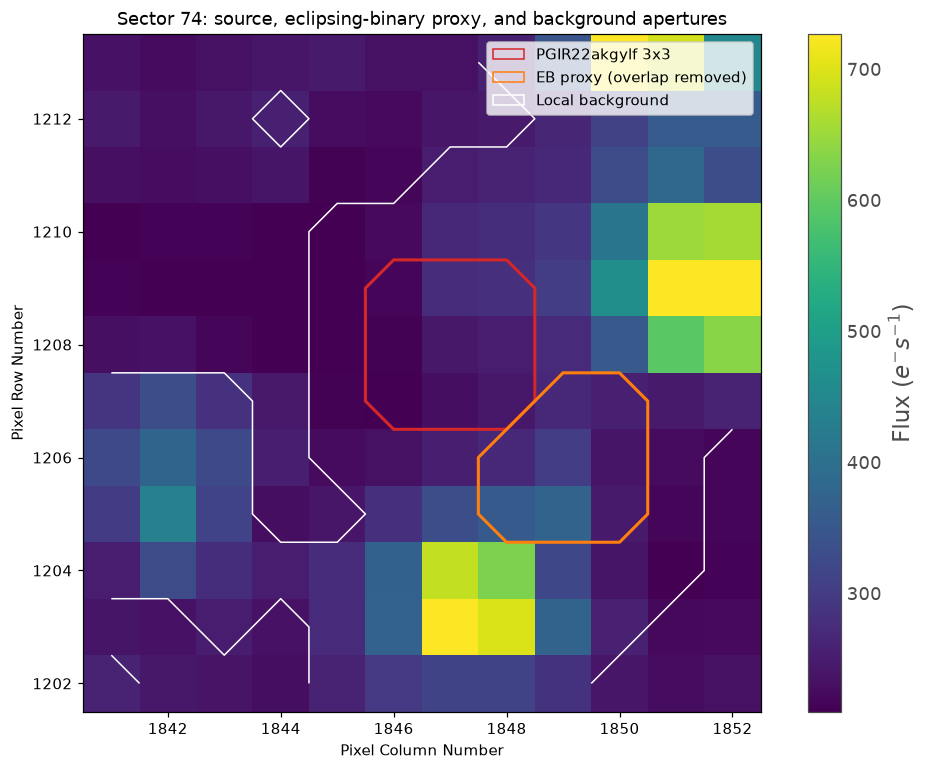

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


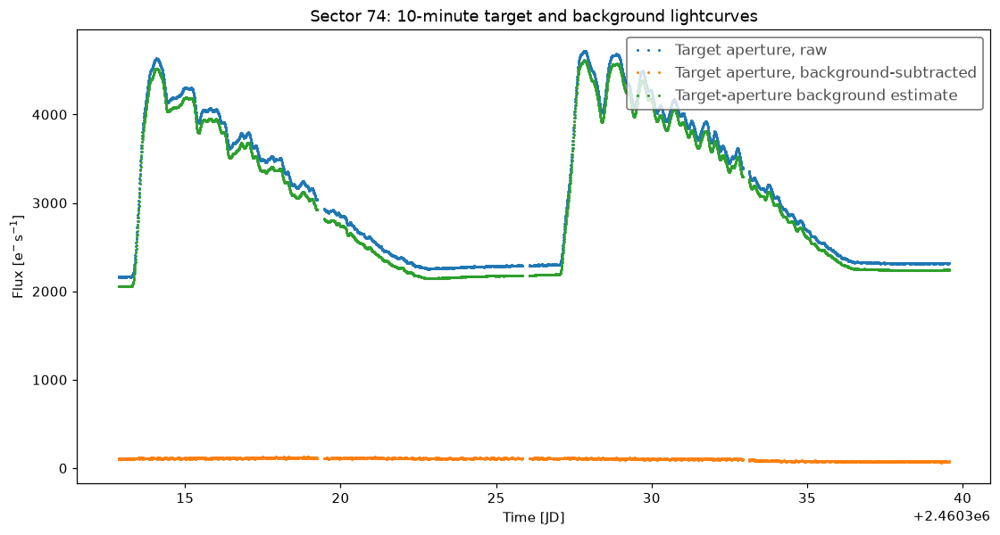

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


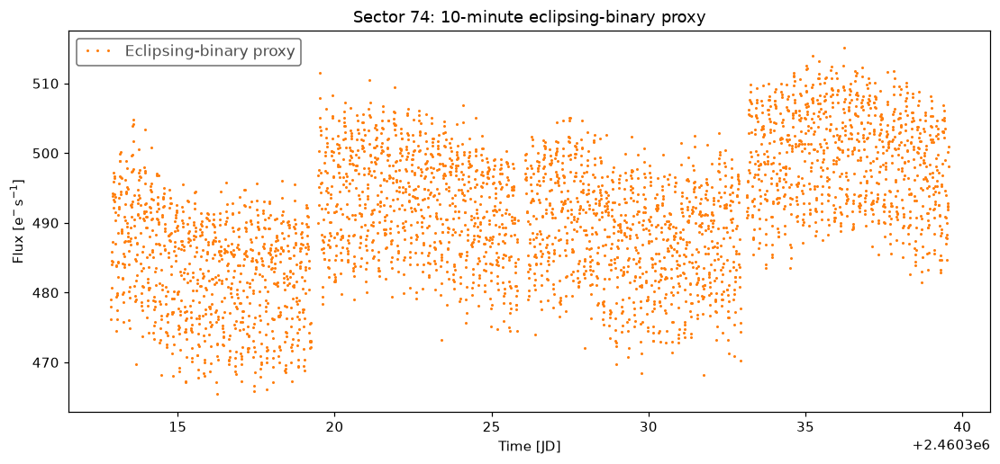

Target points after binning: 3759
Measured binned cadence: 9.999887 minutes

--- Sector 75 extraction ---


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


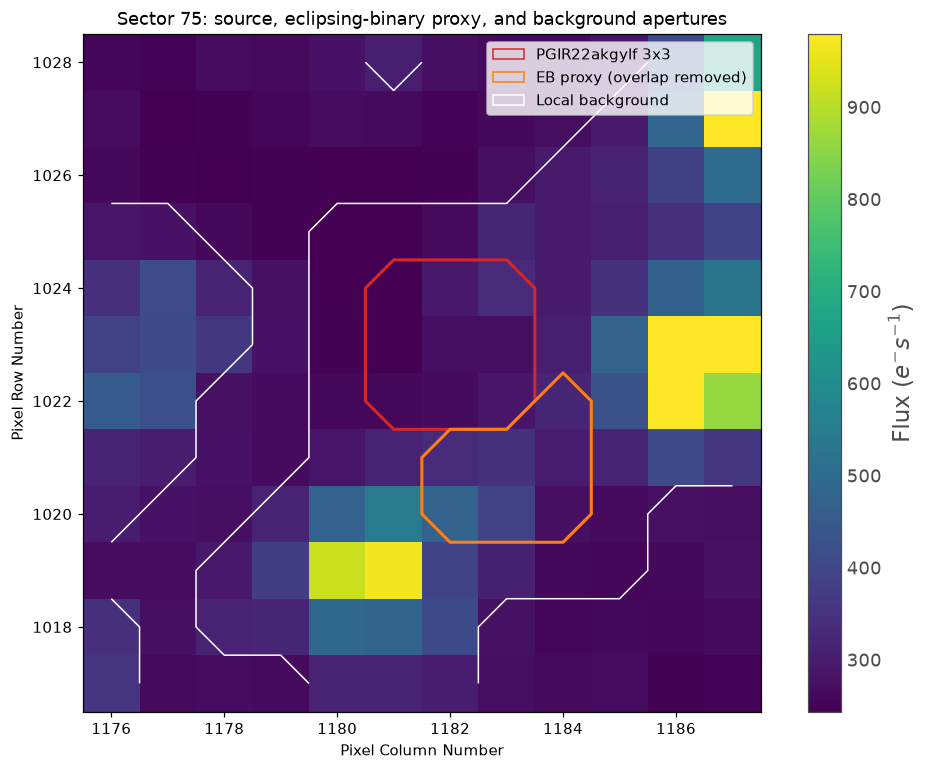

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


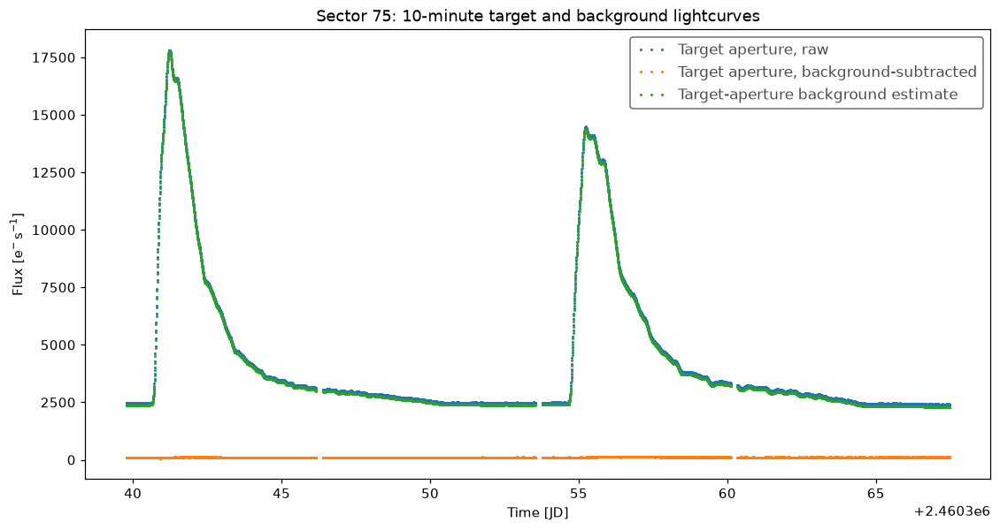

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


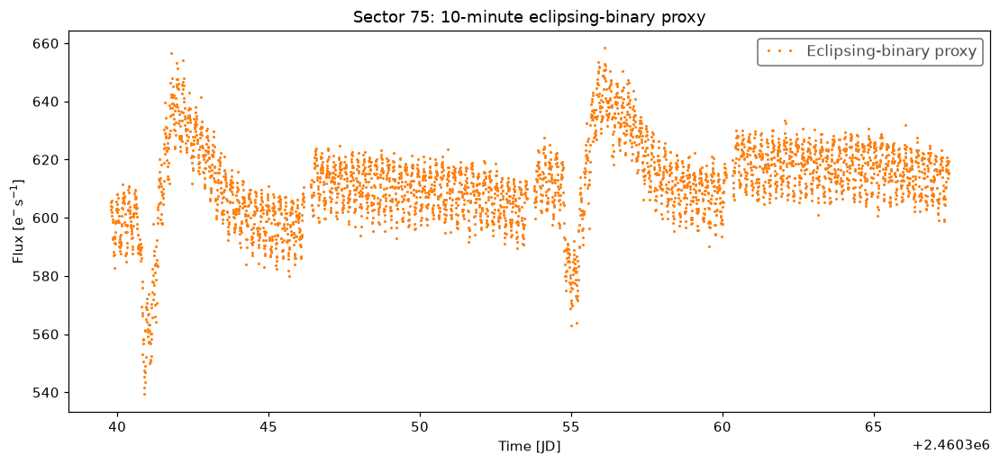

Target points after binning: 3897
Measured binned cadence: 10.000106 minutes


In [6]:
sector_data = {}
for sector in SECTORS:
    print(f"\n--- Sector {sector} extraction ---")
    tpf = tpfs[sector]
    data = extract_sector(tpf, sector)
    sector_data[sector] = data

    plot_apertures(tpf, data["masks"], sector)
    plot_extracted_lightcurves(data, sector)

    for key in (
        "target_raw_binned",
        "target_background_binned",
        "target_binned",
        "eb_binned",
    ):
        data[key].to_csv(OUTPUT_DIR / f"sector{sector}_{key}.csv", overwrite=True)

    print(f"Target points after binning: {len(data['target_binned'])}")
    print(f"Measured binned cadence: {median_cadence_minutes(data['target_binned']):.6f} minutes")

## Period searches before and after eclipsing-binary removal

For each sector, the EB period is measured in a restricted 0.15–0.25-day window from the separate EB proxy aperture. A four-harmonic model at that measured period is then fitted to the detrended nova-aperture lightcurve and subtracted. The 0.1802-day frequency is not part of that contaminant model.


======================== Sector 74 ========================


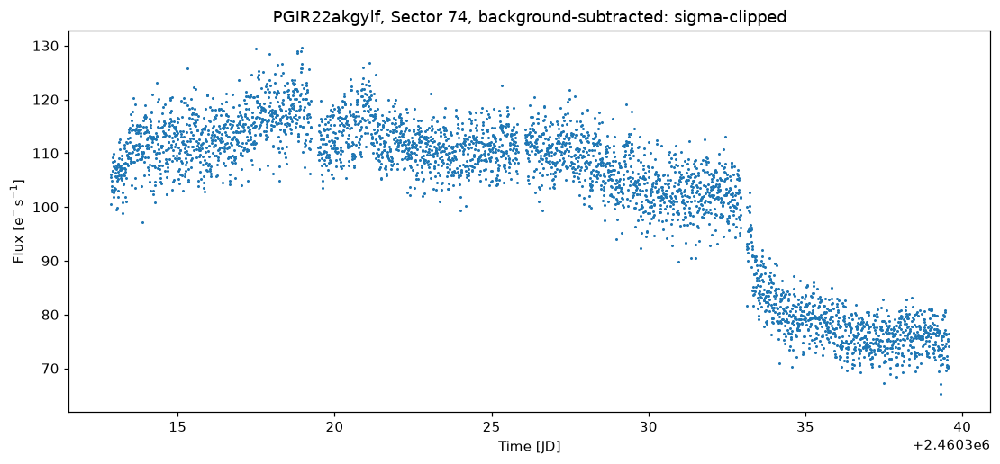

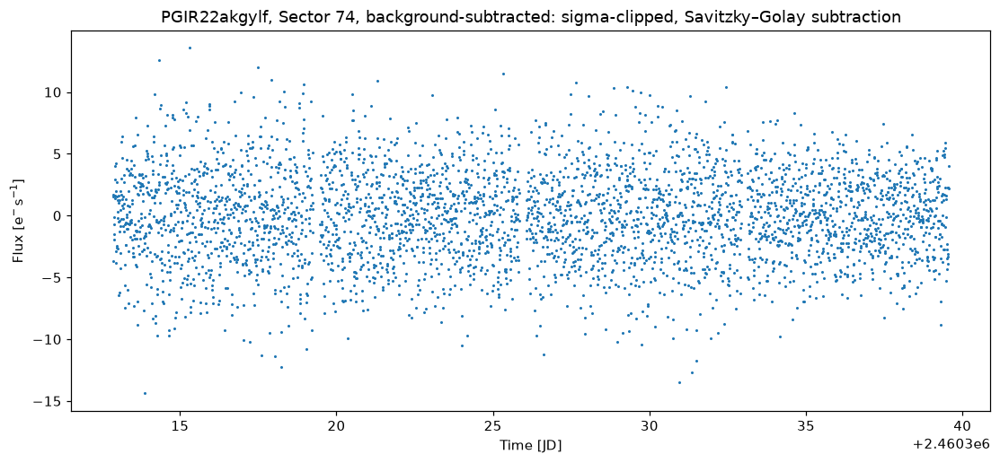

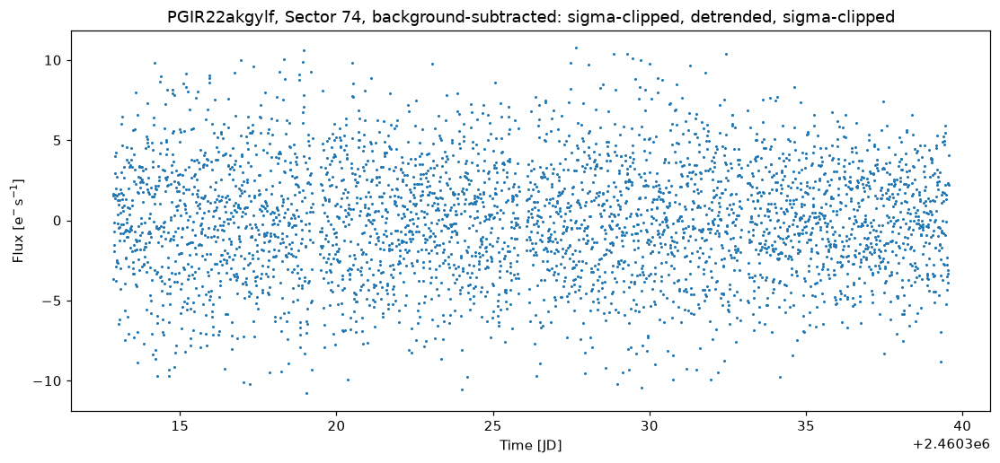

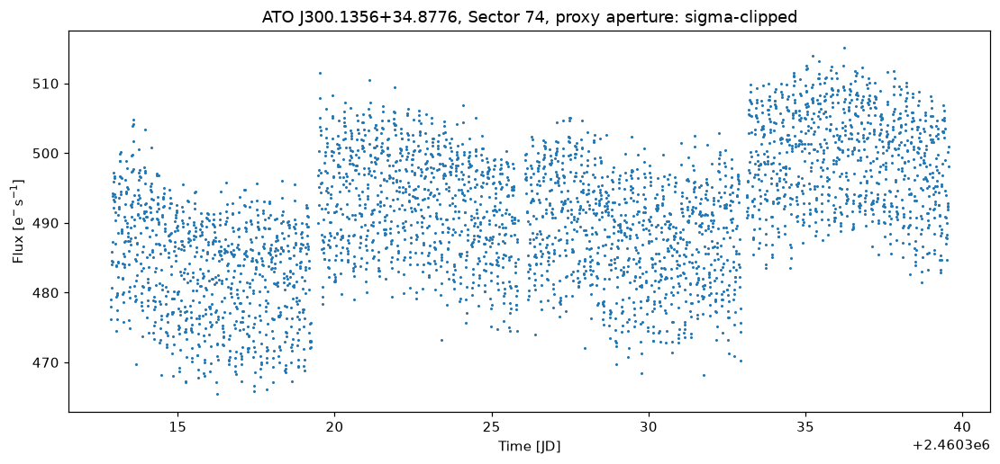

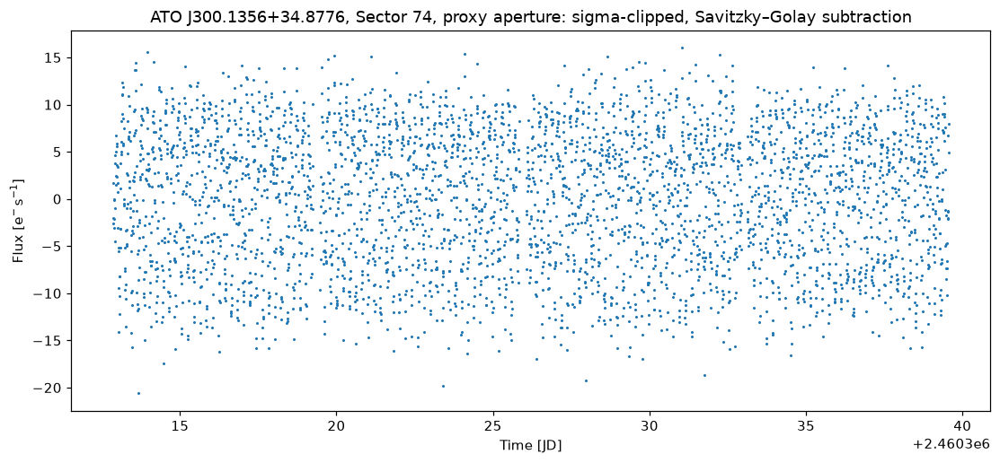

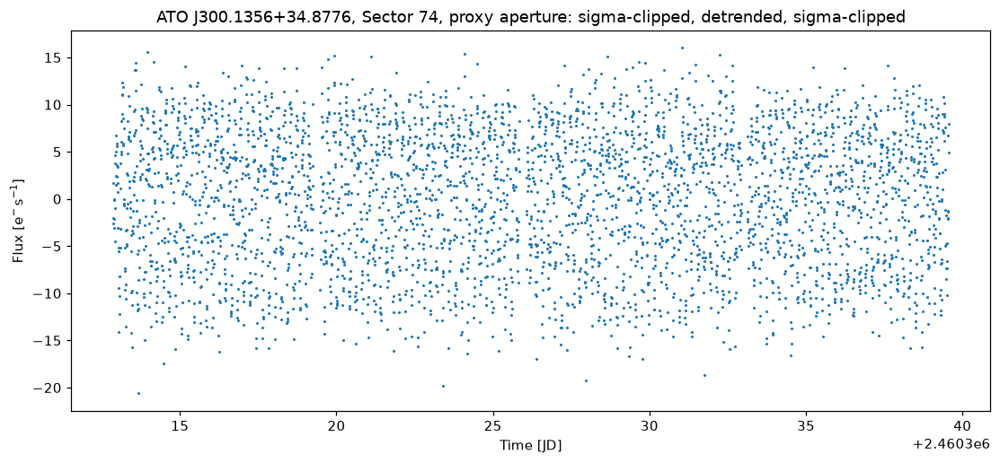

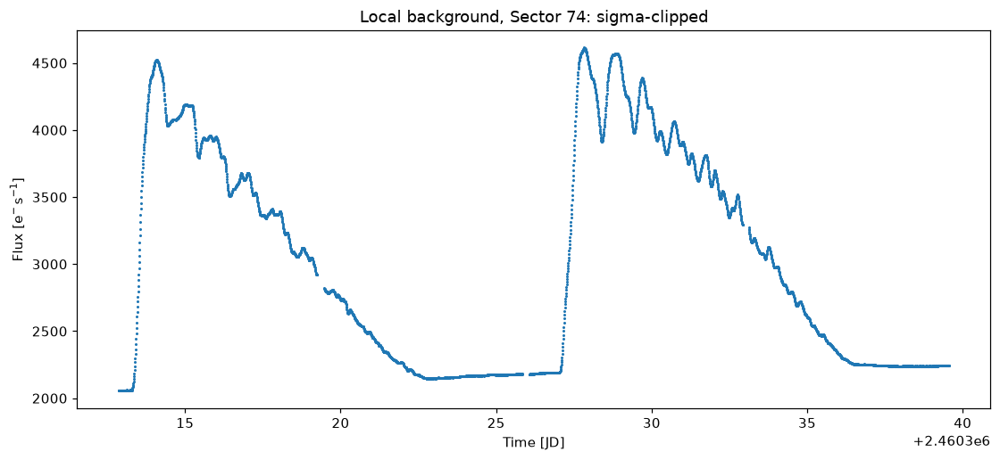

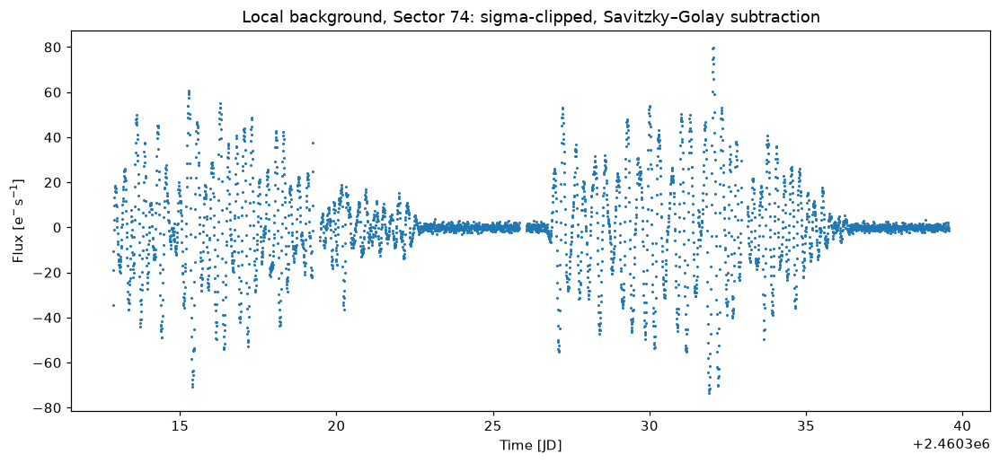

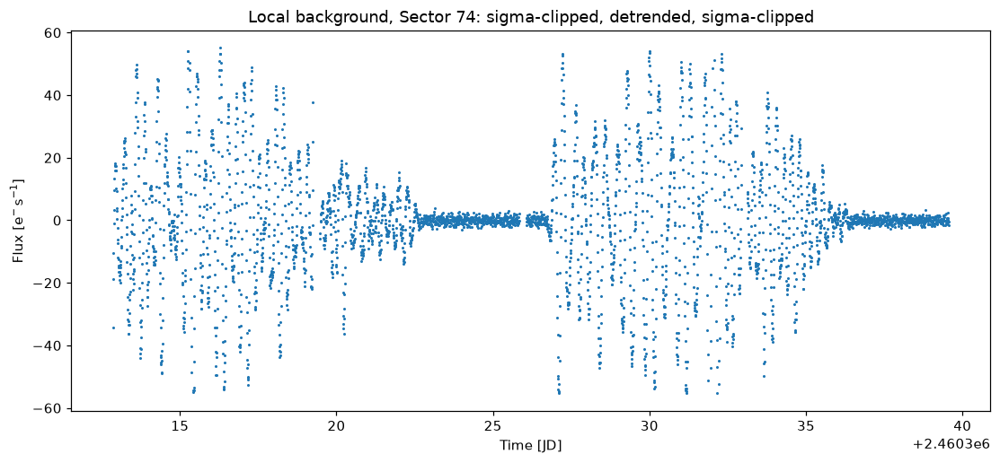

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Measured EB period: 0.198801 ± 0.000740 days


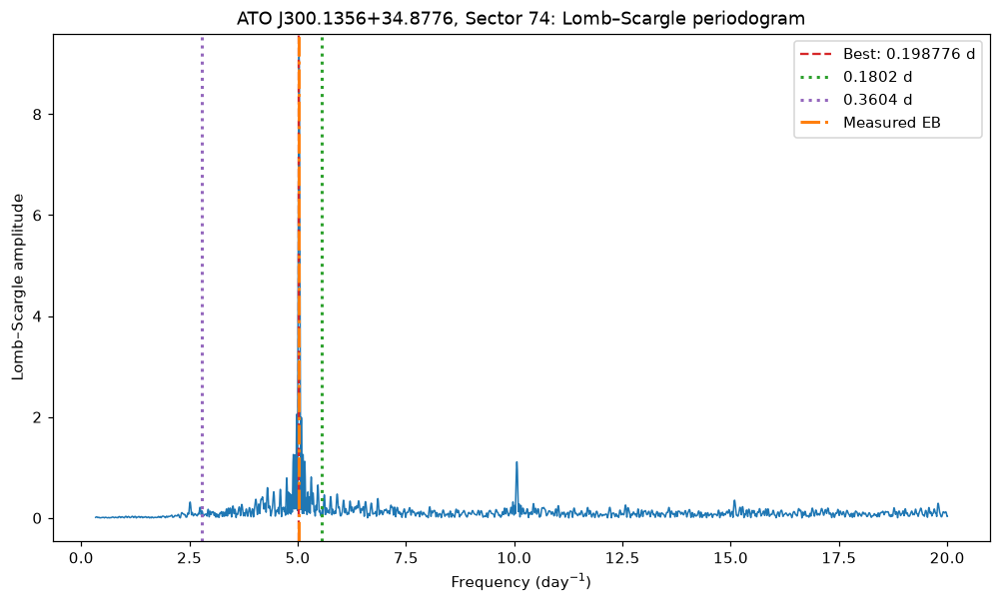

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


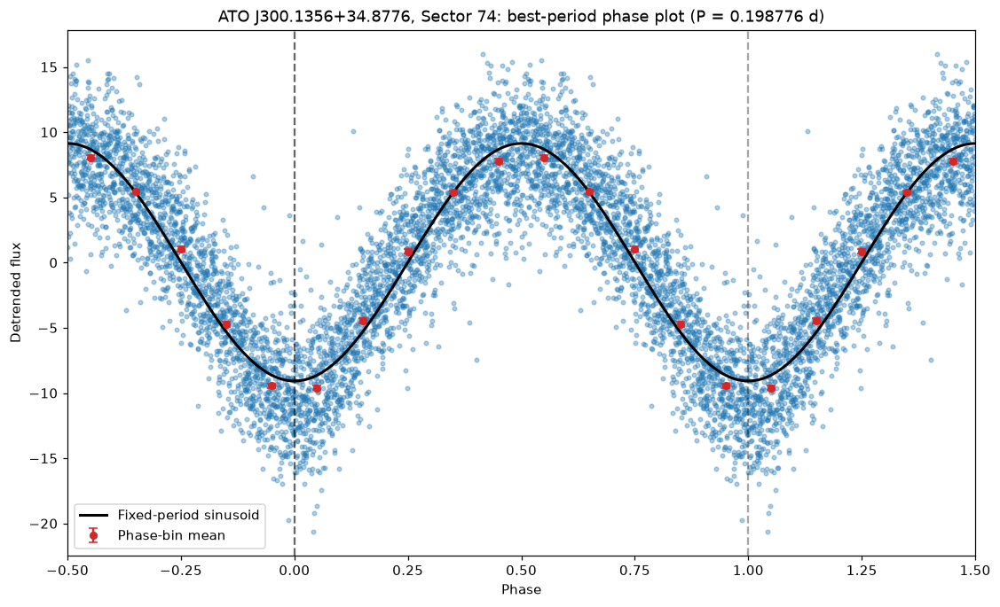

ATO J300.1356+34.8776, Sector 74: best period = 0.198776 ± 0.000740 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


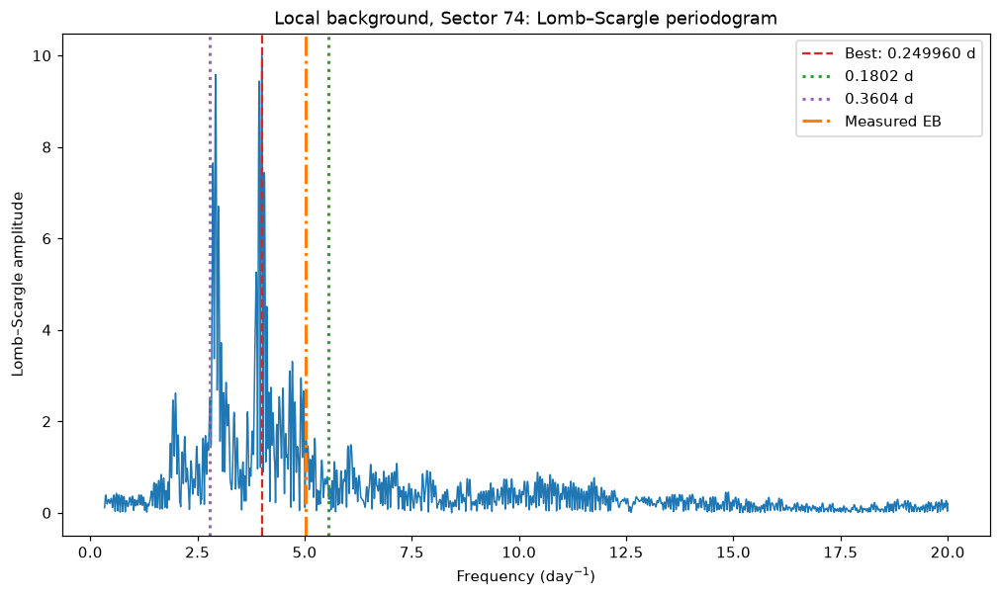

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


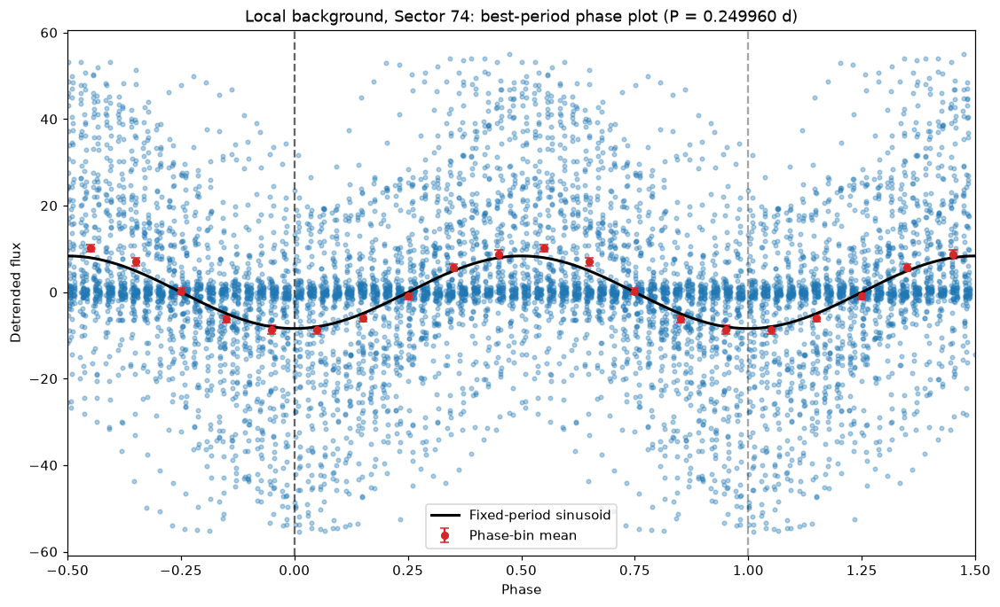

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Local background, Sector 74: best period = 0.249960 ± 0.001170 days


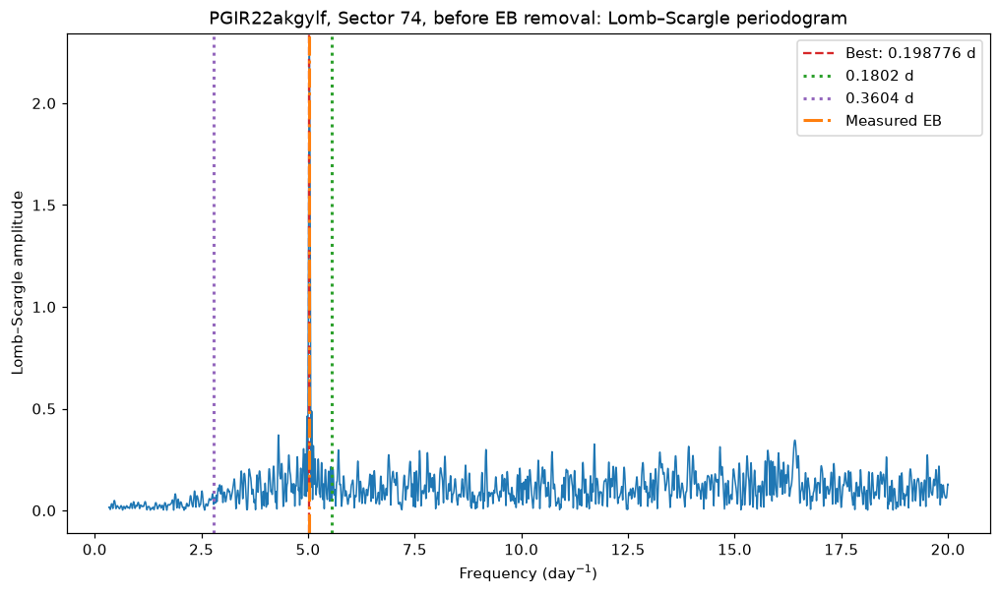

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


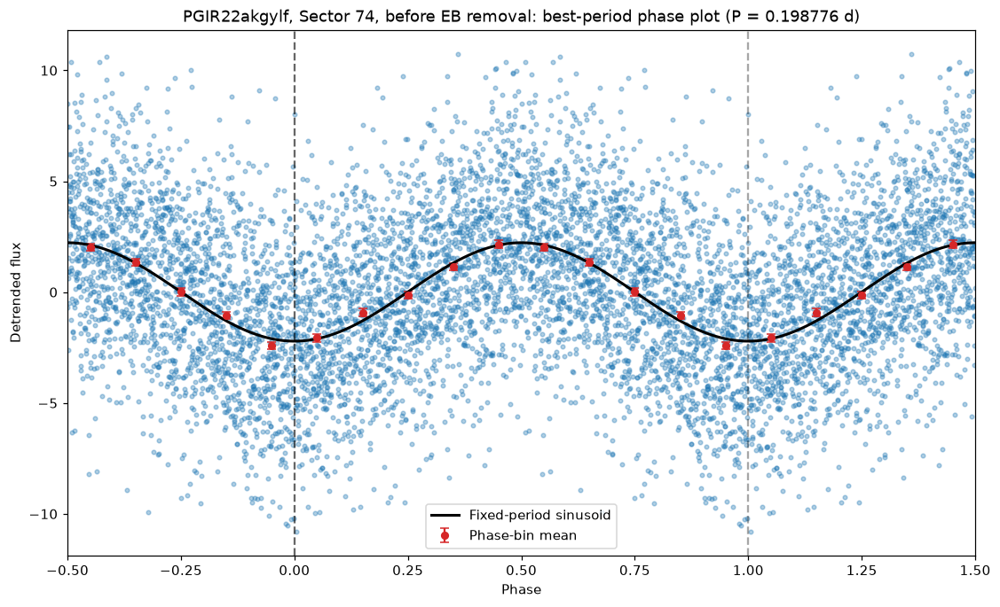

PGIR22akgylf, Sector 74, before EB removal: best period = 0.198776 ± 0.000740 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


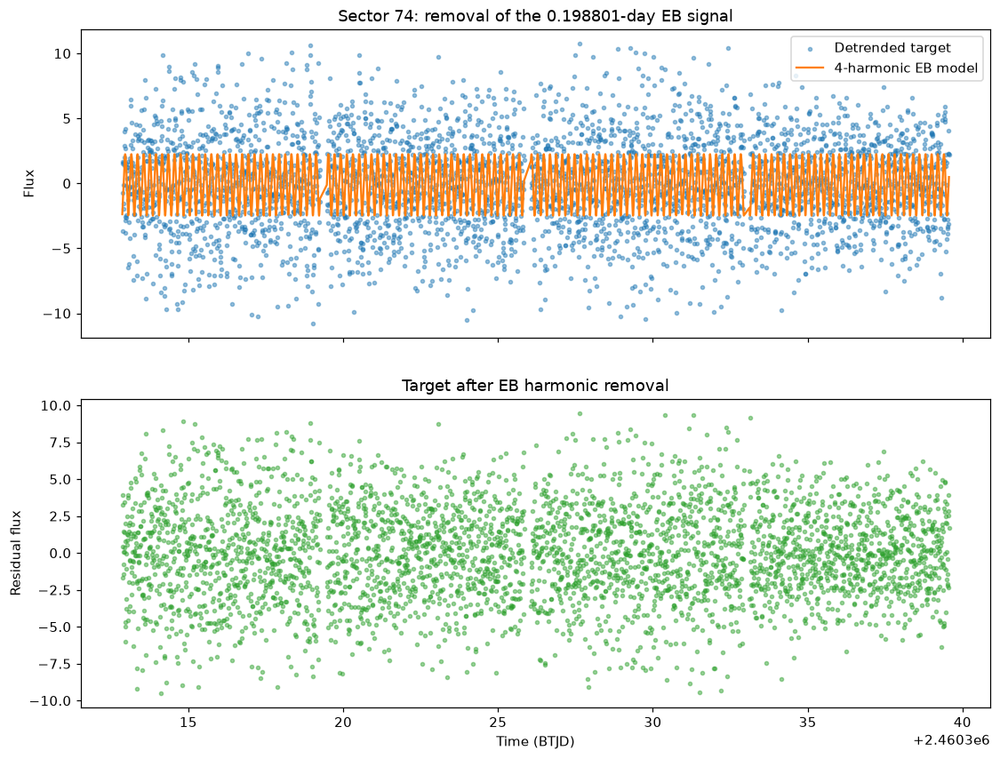

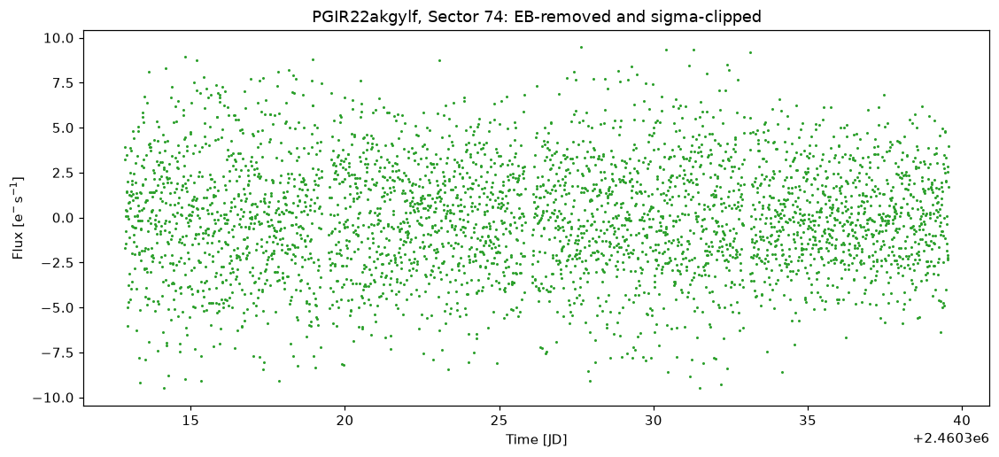

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


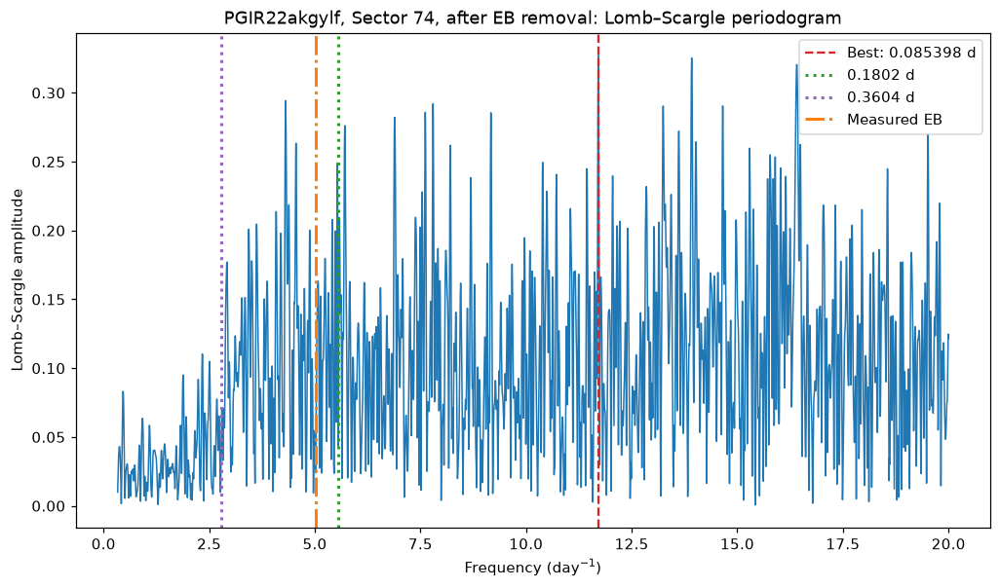

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


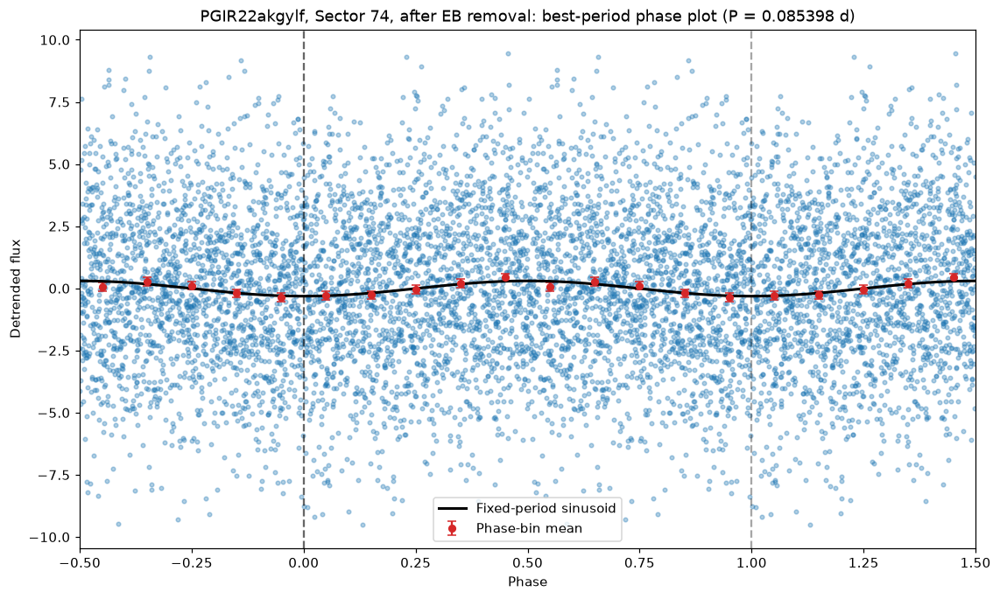

PGIR22akgylf, Sector 74, after EB removal: best period = 0.085398 ± 0.000137 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


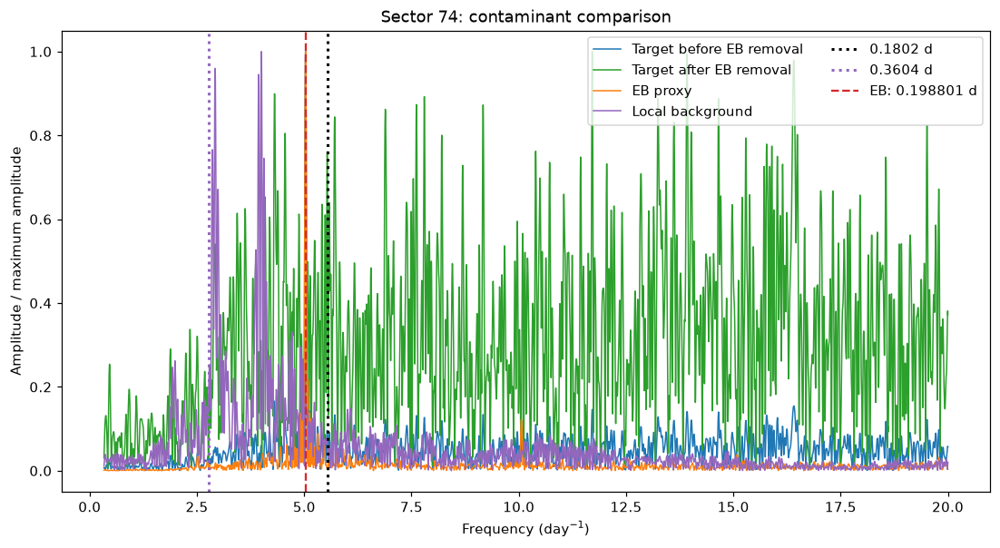

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


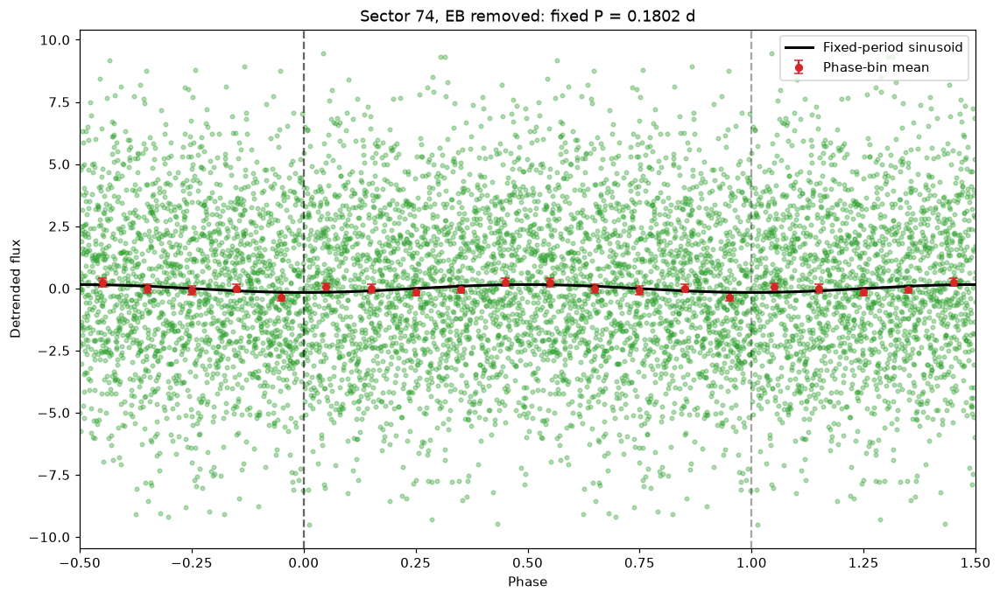

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


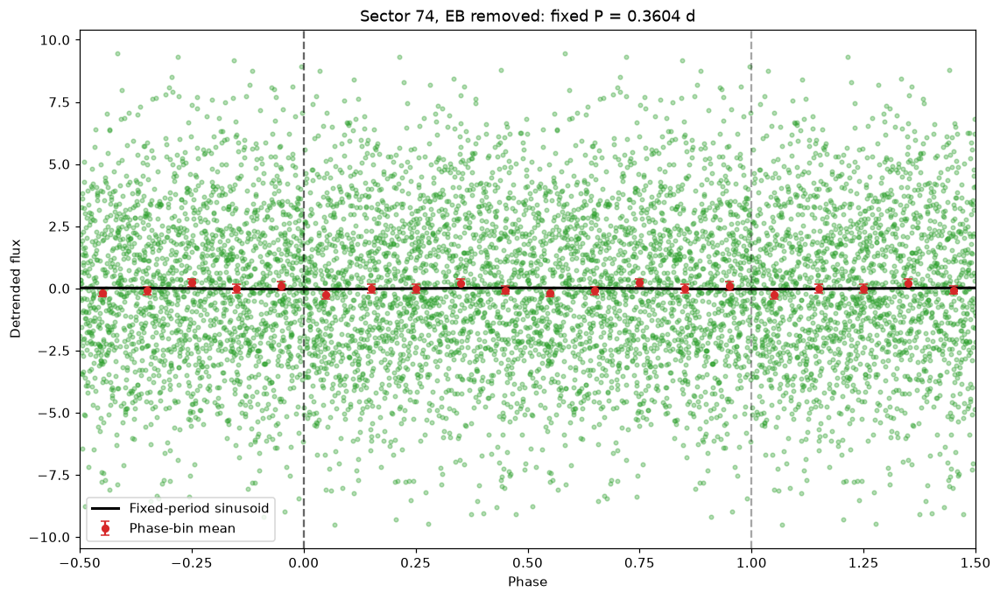


======================== Sector 75 ========================


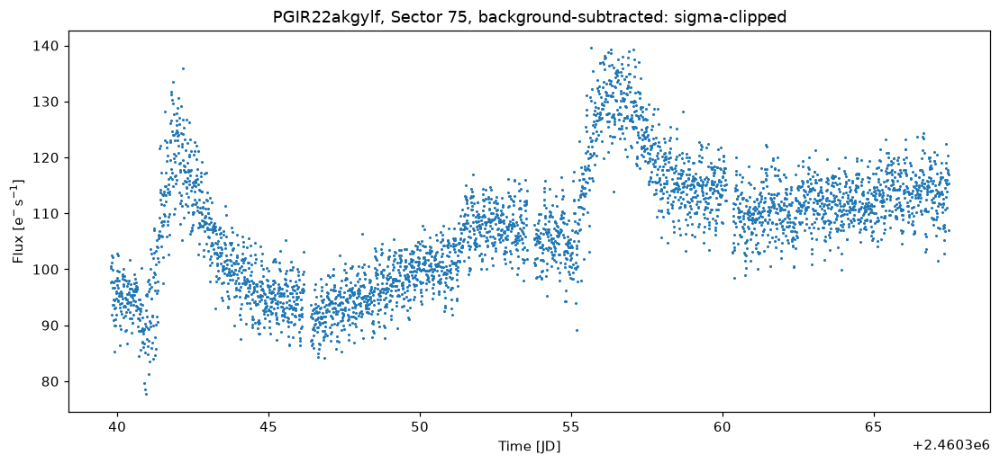

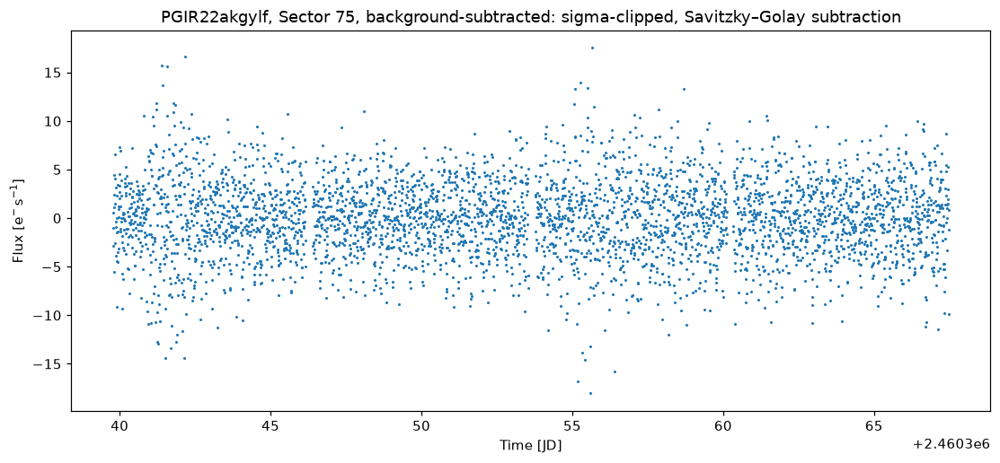

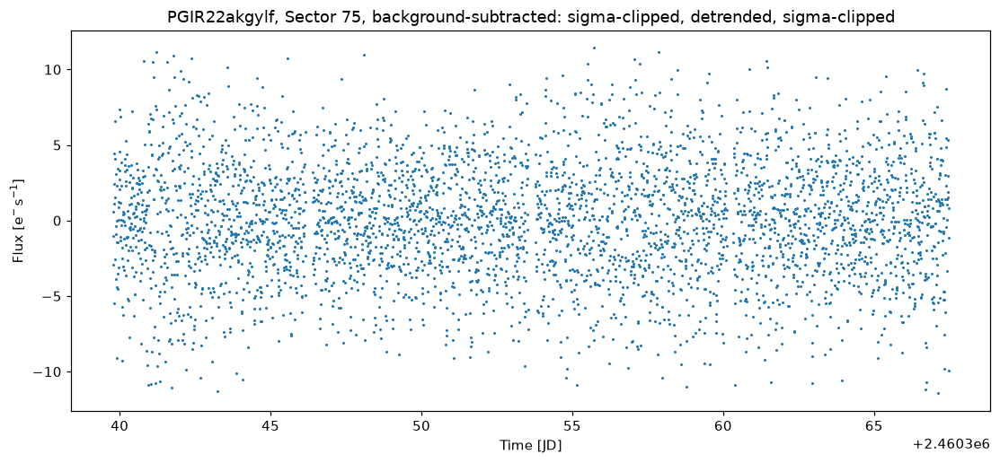

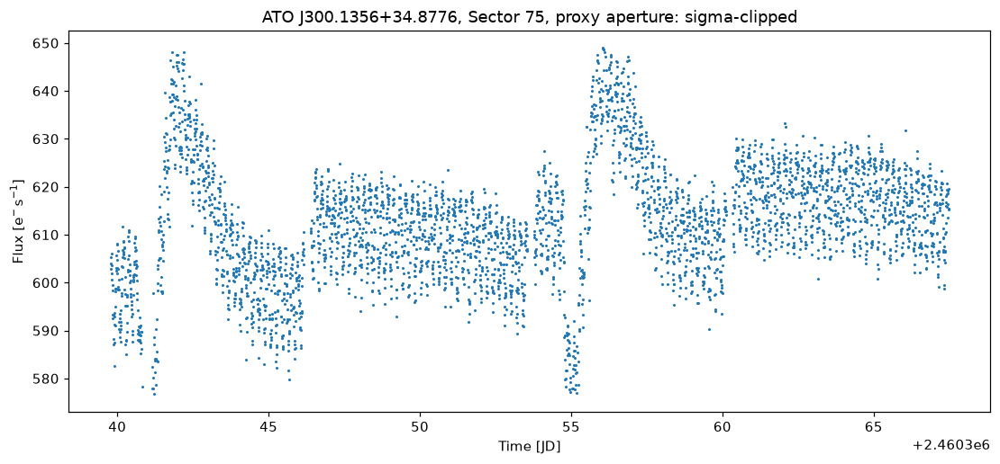

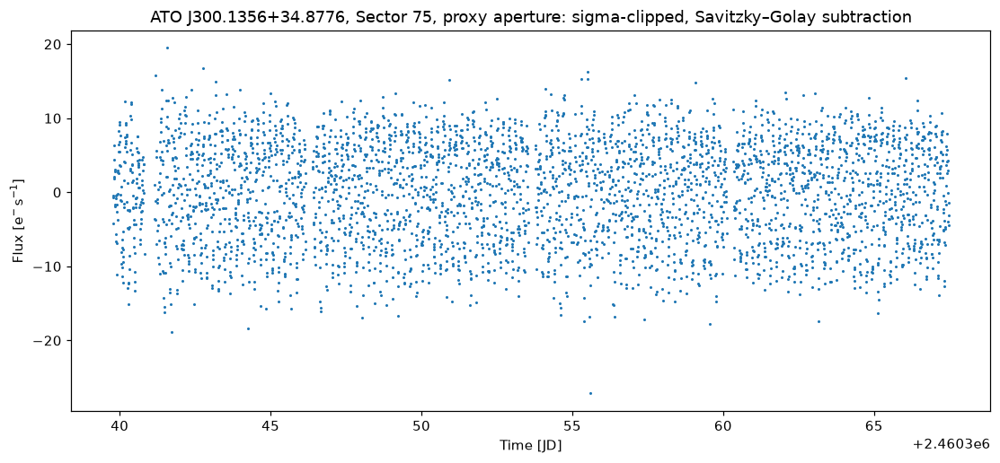

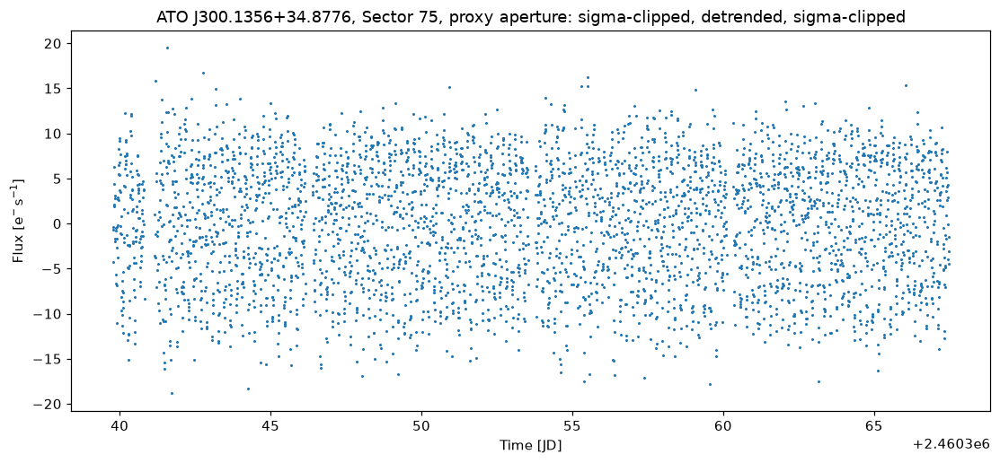

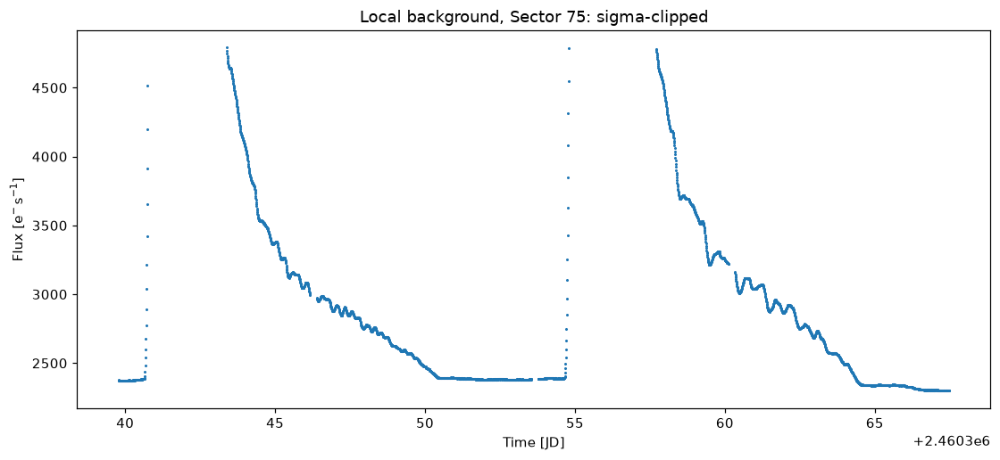

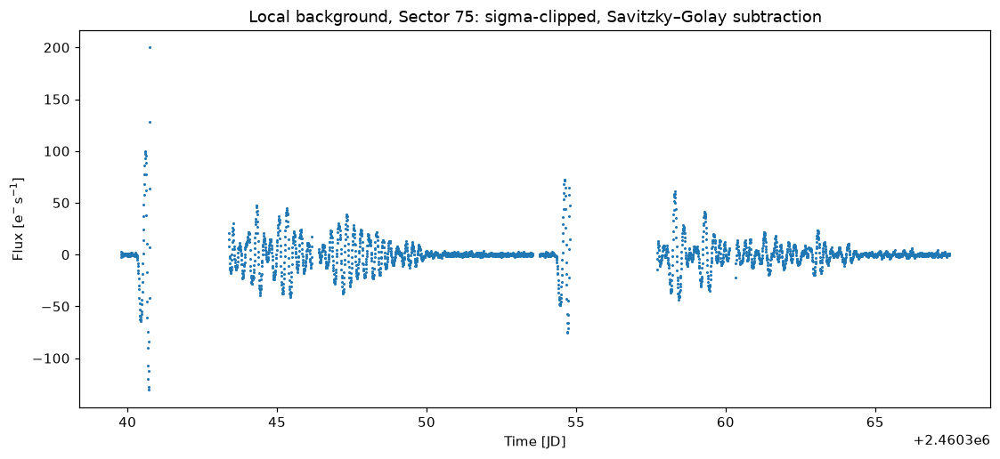

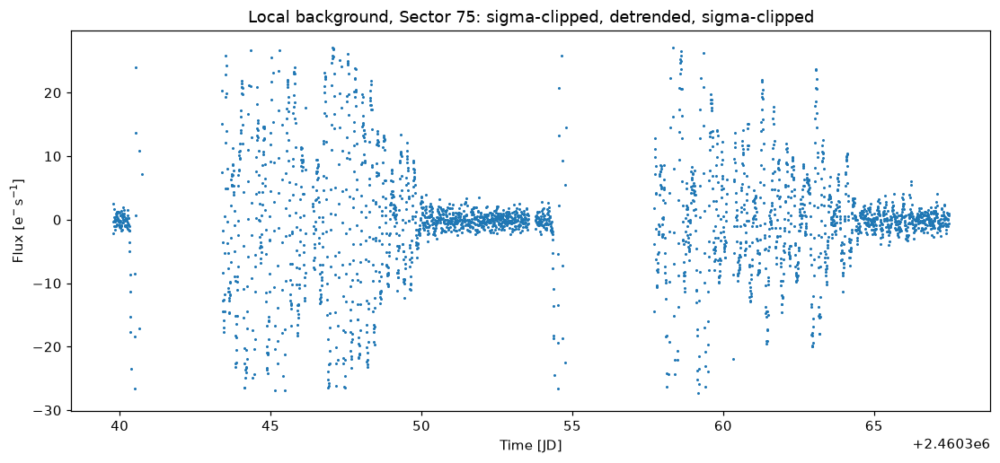

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Measured EB period: 0.198839 ± 0.000714 days


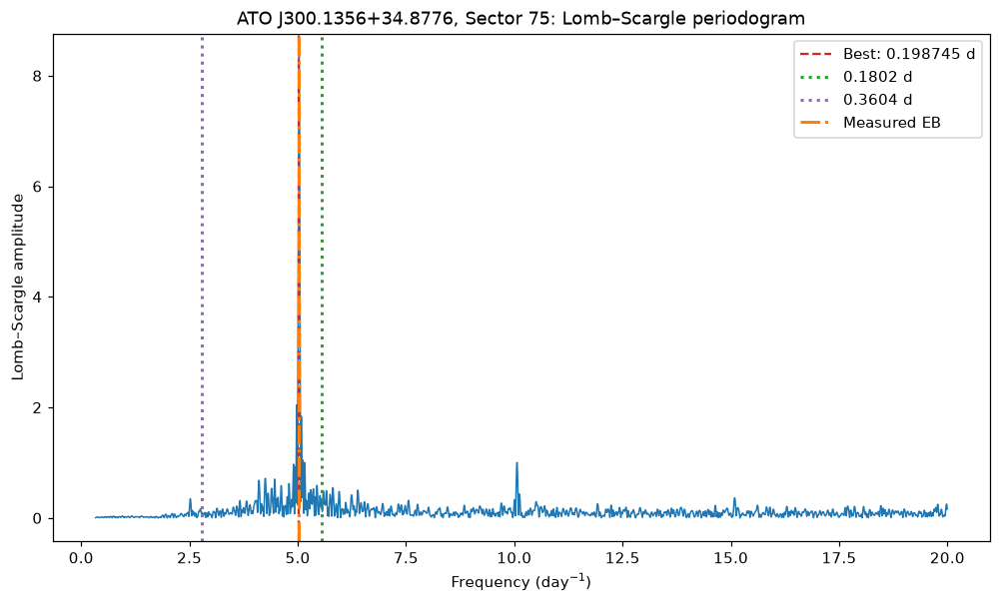

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


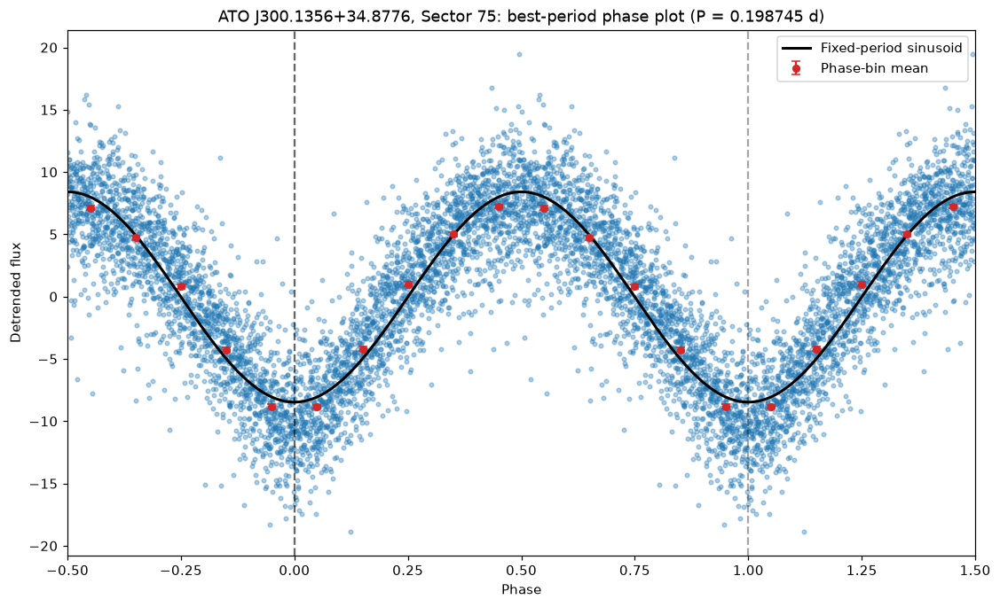

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


ATO J300.1356+34.8776, Sector 75: best period = 0.198745 ± 0.000713 days


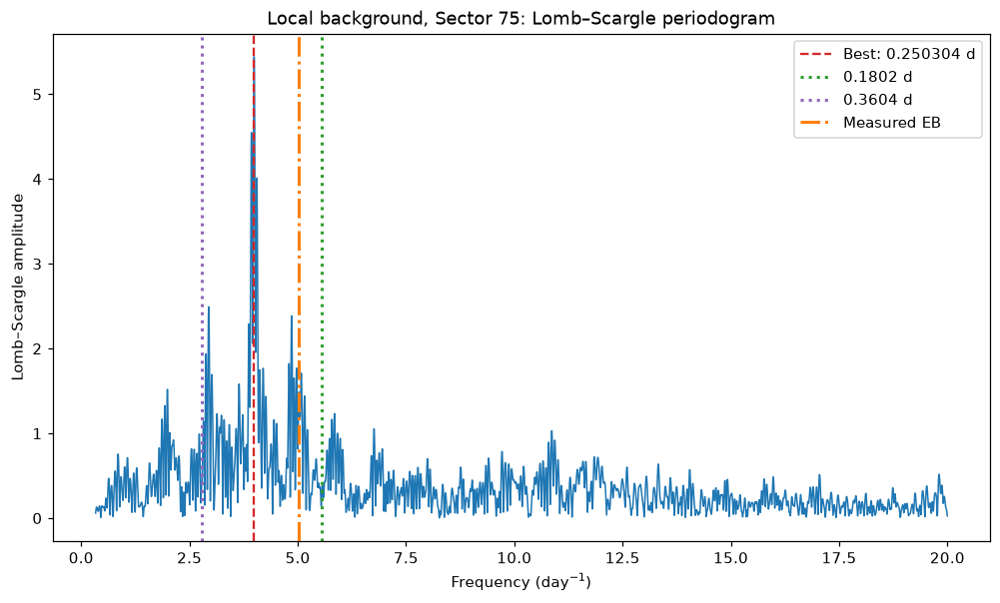

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


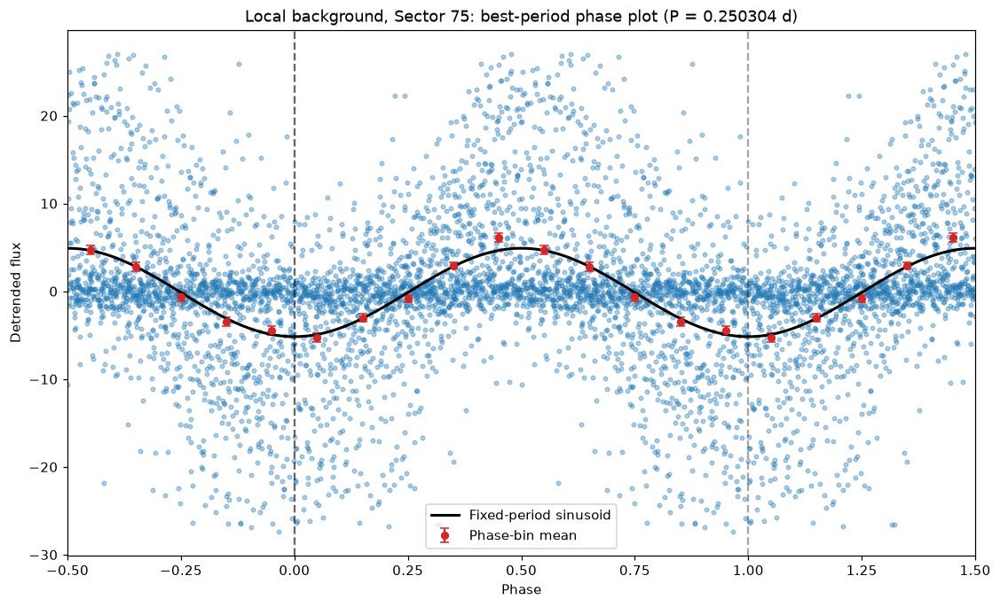

Local background, Sector 75: best period = 0.250304 ± 0.001131 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


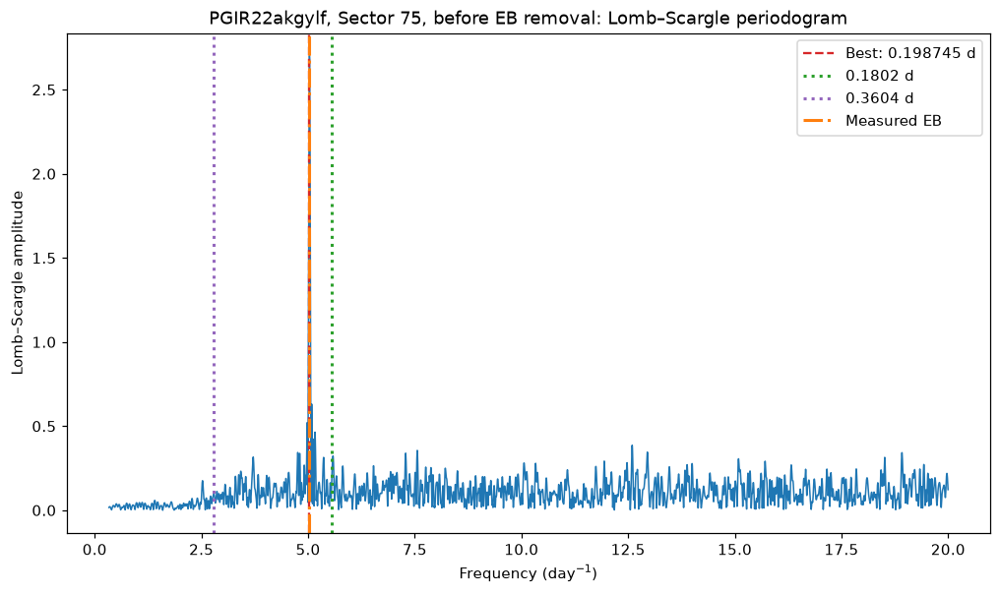

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


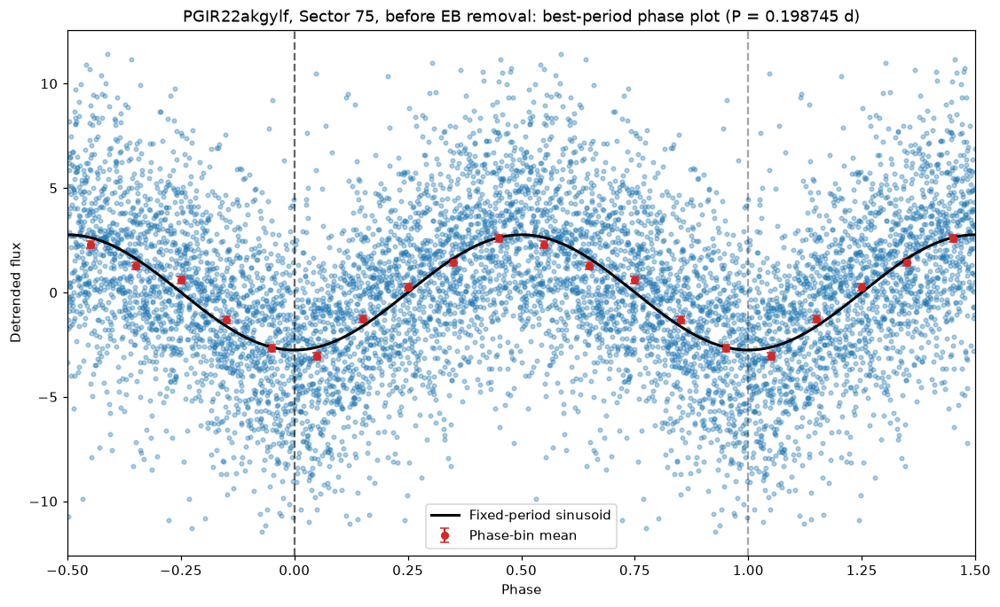

PGIR22akgylf, Sector 75, before EB removal: best period = 0.198745 ± 0.000713 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


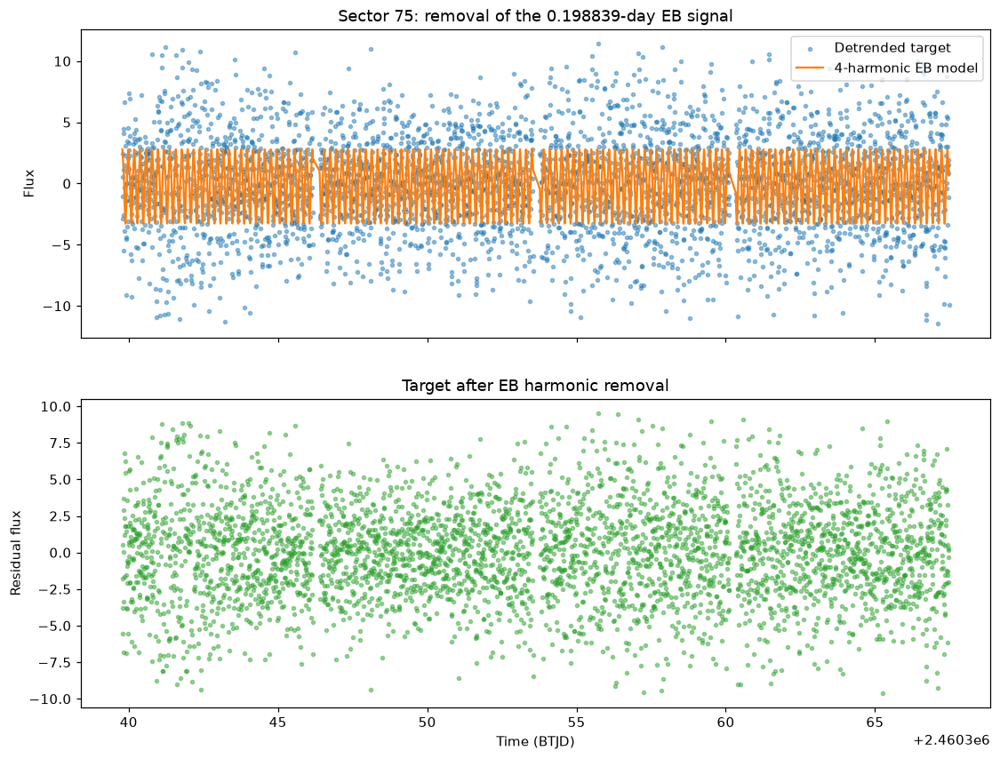

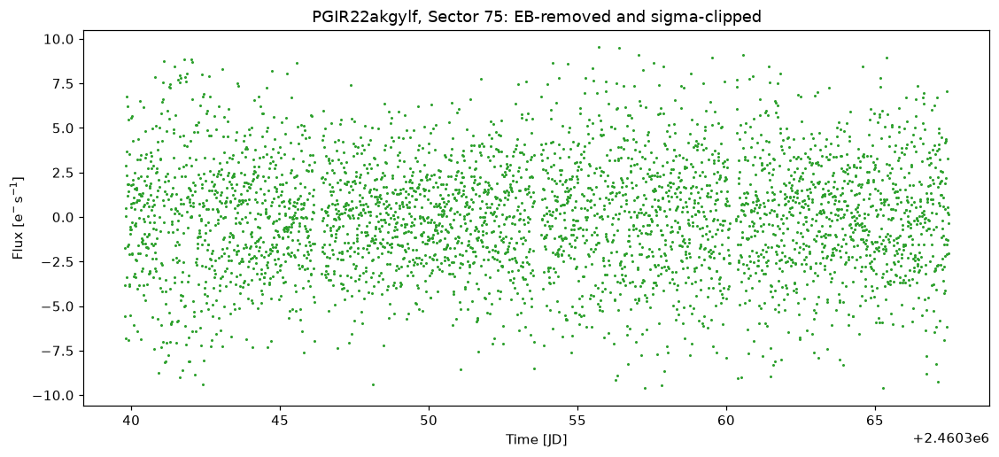

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


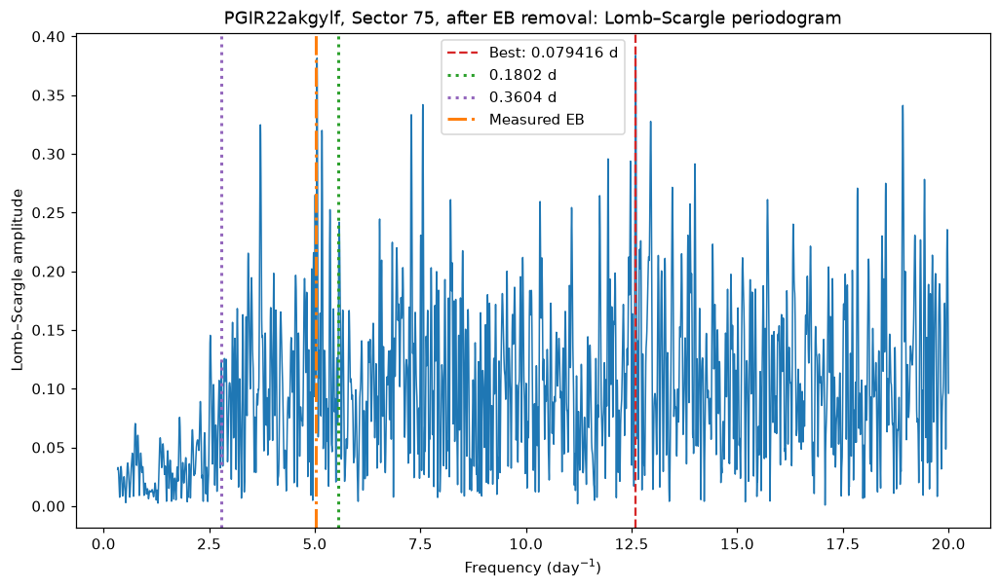

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


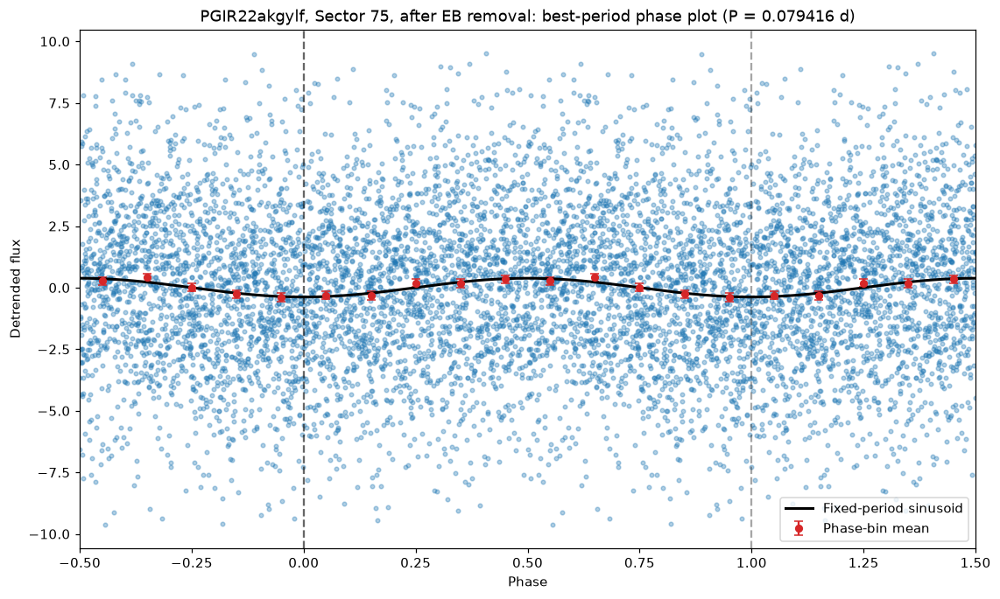

PGIR22akgylf, Sector 75, after EB removal: best period = 0.079416 ± 0.000114 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


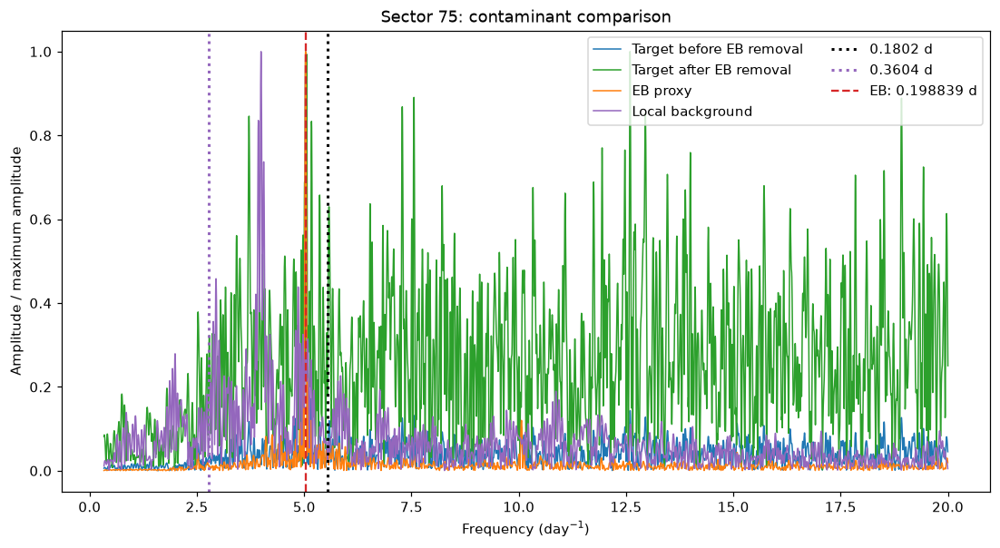

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


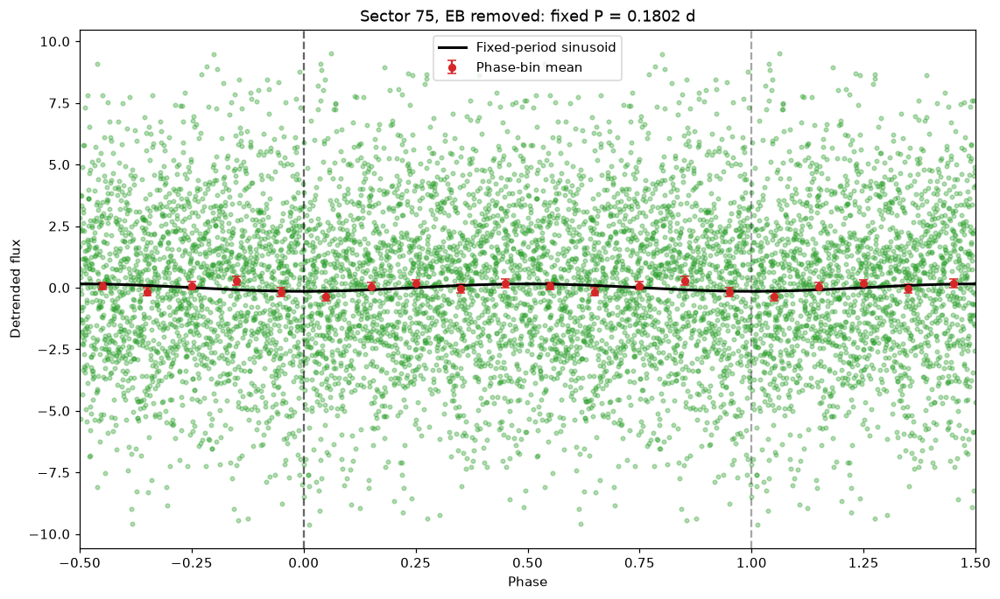

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


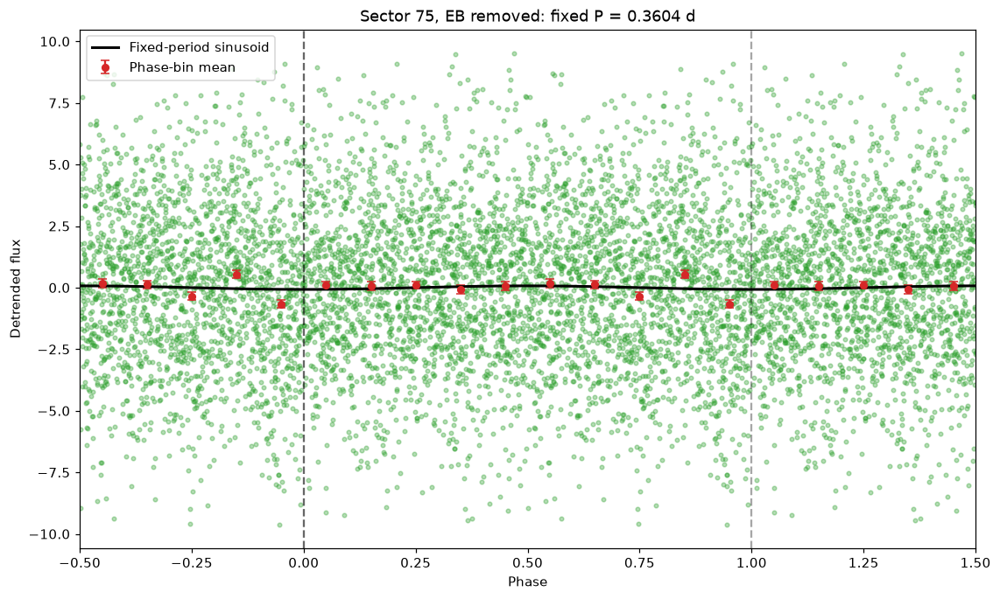

In [7]:
results = {}
summary_rows = []
eb_rows = []

for sector in SECTORS:
    print(f"\n{'=' * 24} Sector {sector} {'=' * 24}")
    data = sector_data[sector]

    target_clean = prepare_lightcurve(
        data["target_binned"],
        f"{TARGET_NAME}, Sector {sector}, background-subtracted",
        f"sector{sector}_target",
    )
    eb_clean = prepare_lightcurve(
        data["eb_binned"],
        f"{EB_NAME}, Sector {sector}, proxy aperture",
        f"sector{sector}_eb_proxy",
    )
    background_clean = prepare_lightcurve(
        data["target_background_binned"],
        f"Local background, Sector {sector}",
        f"sector{sector}_background",
    )

    eb_period, eb_local_periodogram = measure_eb_period(eb_clean)
    eb_duration = (eb_clean.time[-1] - eb_clean.time[0]).to_value(u.day)
    eb_period_error = 0.5 * eb_period.value**2 / eb_duration
    print(f"Measured EB period: {eb_period.value:.6f} ± {eb_period_error:.6f} days")
    eb_rows.append({
        "sector": str(sector),
        "eb_period_d": eb_period.value,
        "period_error_d": eb_period_error,
    })

    eb_info = run_period_diagnostics(
        eb_clean,
        f"{EB_NAME}, Sector {sector}",
        f"sector{sector}_eb_proxy_period_analysis",
        eb_period=eb_period,
    )
    background_info = run_period_diagnostics(
        background_clean,
        f"Local background, Sector {sector}",
        f"sector{sector}_background_period_analysis",
        eb_period=eb_period,
    )
    before_info = run_period_diagnostics(
        target_clean,
        f"{TARGET_NAME}, Sector {sector}, before EB removal",
        f"sector{sector}_target_before_eb_removal",
        eb_period=eb_period,
    )

    target_eb_removed, eb_model, eb_coefficients = remove_eb_harmonics(
        target_clean, eb_period
    )
    target_eb_removed = target_eb_removed.remove_outliers(sigma=3)
    plot_eb_removal(target_clean, eb_model, target_eb_removed, sector, eb_period)
    plot_lightcurve_stage(
        target_eb_removed,
        f"{TARGET_NAME}, Sector {sector}: EB-removed and sigma-clipped",
        f"sector{sector}_target_eb_removed_sigma_clipped",
        color="tab:green",
    )
    after_info = run_period_diagnostics(
        target_eb_removed,
        f"{TARGET_NAME}, Sector {sector}, after EB removal",
        f"sector{sector}_target_after_eb_removal",
        eb_period=eb_period,
    )
    plot_periodogram_comparison(
        before_info["periodogram"],
        after_info["periodogram"],
        eb_info["periodogram"],
        background_info["periodogram"],
        sector,
        eb_period,
    )

    # Fixed-period plots ensure both scientific hypotheses are inspected even
    # when the strongest peak occurs elsewhere.
    plot_phased_lightcurve(
        target_eb_removed,
        NOVA_PERIOD,
        f"Sector {sector}, EB removed: fixed P = {NOVA_PERIOD.value:.4f} d",
        f"sector{sector}_target_after_eb_removal_phase_0p1802d",
        color="tab:green",
    )
    plot_phased_lightcurve(
        target_eb_removed,
        DOUBLE_PERIOD,
        f"Sector {sector}, EB removed: fixed P = {DOUBLE_PERIOD.value:.4f} d",
        f"sector{sector}_target_after_eb_removal_phase_0p3604d",
        color="tab:green",
    )

    for stage, lc, info in [
        ("before_eb_removal", target_clean, before_info),
        ("after_eb_removal", target_eb_removed, after_info),
        ("eb_proxy", eb_clean, eb_info),
        ("local_background", background_clean, background_info),
    ]:
        summary_rows.append(candidate_summary_row(
            sector, stage, lc, info["periodogram"], NOVA_PERIOD, 0.01,
            info["best_period"],
        ))
        summary_rows.append(candidate_summary_row(
            sector, stage, lc, info["periodogram"], DOUBLE_PERIOD, 0.02,
            info["best_period"],
        ))

    target_eb_removed.to_csv(
        OUTPUT_DIR / f"sector{sector}_target_eb_removed_10min.csv",
        overwrite=True,
    )
    results[sector] = {
        "target_clean": target_clean,
        "eb_clean": eb_clean,
        "background_clean": background_clean,
        "eb_period": eb_period,
        "eb_period_error": eb_period_error,
        "target_eb_removed": target_eb_removed,
        "before": before_info,
        "after": after_info,
        "eb": eb_info,
        "background": background_info,
        "eb_coefficients": eb_coefficients,
    }

## Combined Sectors 74+75 search

The contaminant is removed separately in each sector before combining them, which allows the leakage amplitude and detector orientation to differ between sectors.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


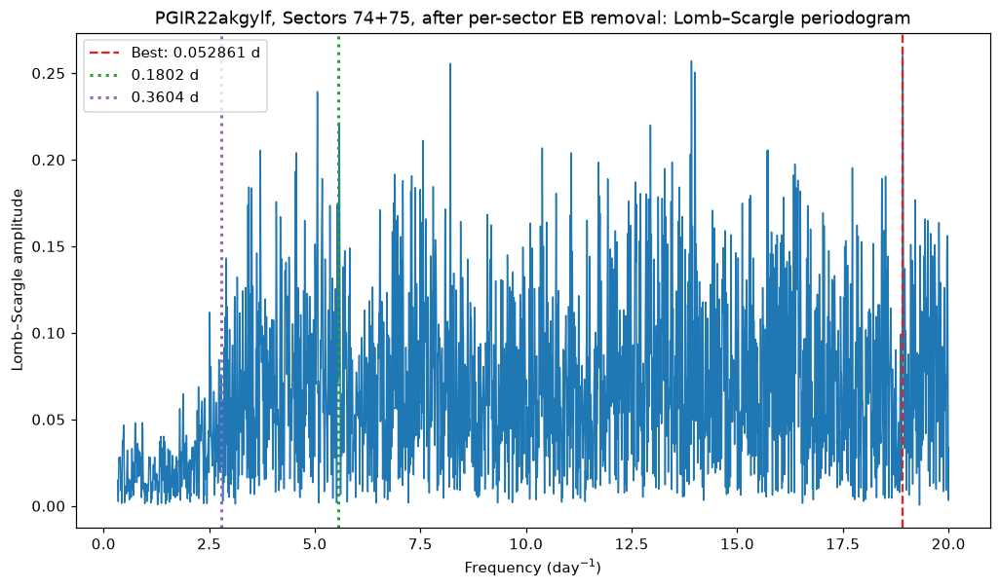

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


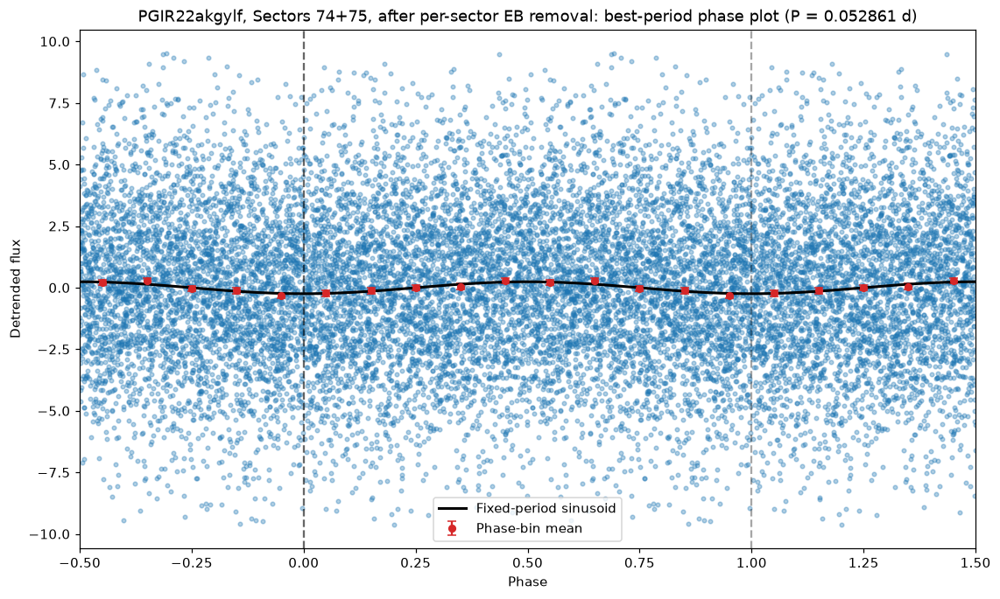

PGIR22akgylf, Sectors 74+75, after per-sector EB removal: best period = 0.052861 ± 0.000026 days


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


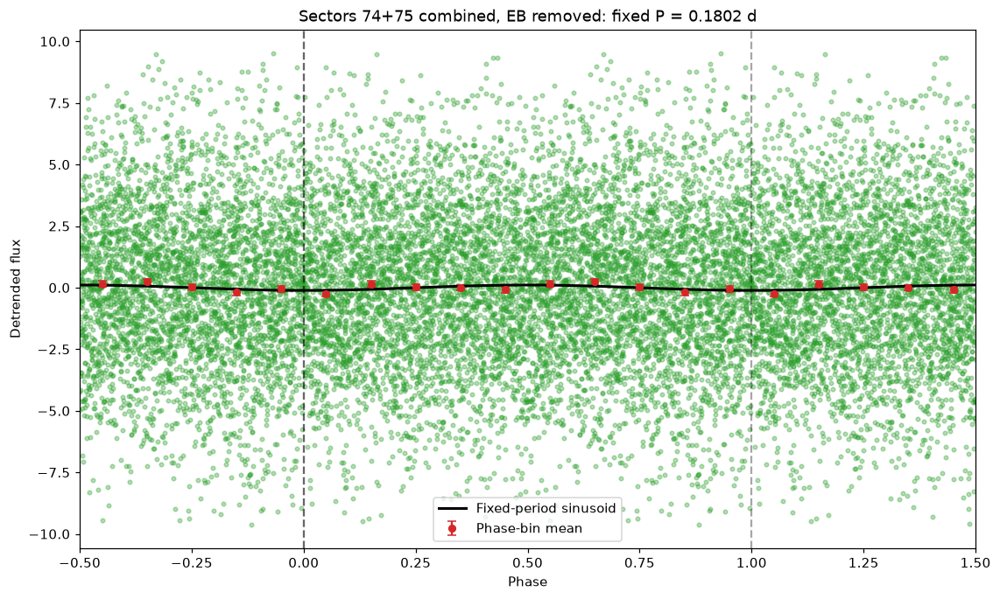

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


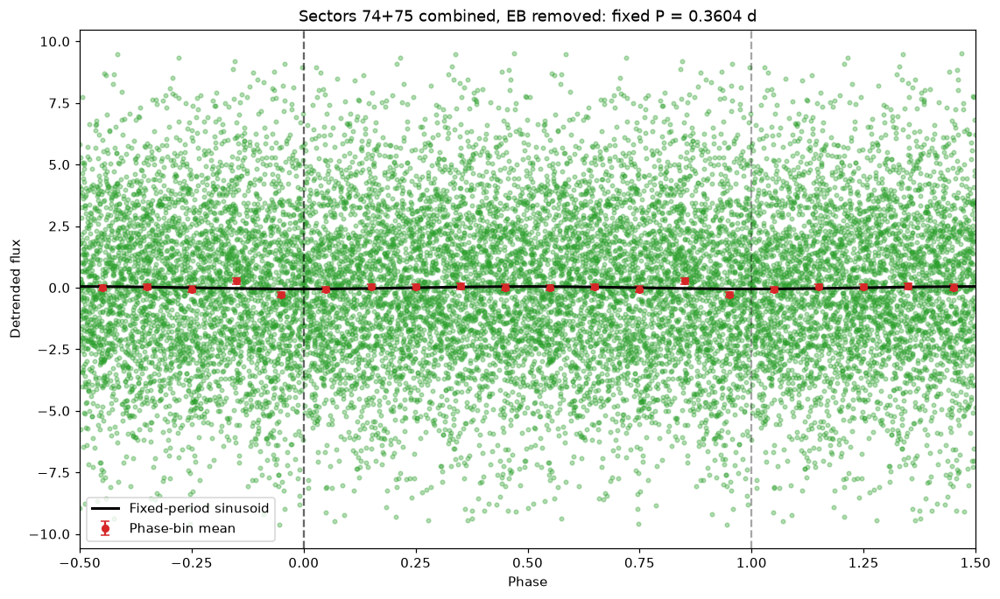

In [8]:
combined_clean = concatenate_lightcurves(
    [results[sector]["target_eb_removed"] for sector in SECTORS]
)
combined_info = run_period_diagnostics(
    combined_clean,
    f"{TARGET_NAME}, Sectors 74+75, after per-sector EB removal",
    "sectors74_75_combined_after_eb_removal",
)

plot_phased_lightcurve(
    combined_clean,
    NOVA_PERIOD,
    f"Sectors 74+75 combined, EB removed: fixed P = {NOVA_PERIOD.value:.4f} d",
    "sectors74_75_combined_after_eb_removal_phase_0p1802d",
    color="tab:green",
)
plot_phased_lightcurve(
    combined_clean,
    DOUBLE_PERIOD,
    f"Sectors 74+75 combined, EB removed: fixed P = {DOUBLE_PERIOD.value:.4f} d",
    "sectors74_75_combined_after_eb_removal_phase_0p3604d",
    color="tab:green",
)

for candidate, half_width in [(NOVA_PERIOD, 0.01), (DOUBLE_PERIOD, 0.02)]:
    summary_rows.append(candidate_summary_row(
        "74+75",
        "after_eb_removal",
        combined_clean,
        combined_info["periodogram"],
        candidate,
        half_width,
        combined_info["best_period"],
    ))

combined_clean.to_csv(
    OUTPUT_DIR / "sectors74_75_combined_target_eb_removed_10min.csv",
    overwrite=True,
)

## Numerical summary

In [9]:
eb_summary = Table(rows=eb_rows)
summary = Table(rows=summary_rows)

for column in (
    "candidate_period_d",
    "local_peak_period_d",
    "ls_amplitude_at_candidate",
    "fitted_semi_amplitude",
    "semi_amplitude_error",
    "amplitude_snr",
    "global_best_period_d",
):
    summary[column].info.format = ".6g"
eb_summary["eb_period_d"].info.format = ".7f"
eb_summary["period_error_d"].info.format = ".7f"

eb_summary.write(OUTPUT_DIR / "measured_eb_periods.csv", format="ascii.csv", overwrite=True)
summary.write(OUTPUT_DIR / "candidate_period_summary.csv", format="ascii.csv", overwrite=True)

print("Measured eclipsing-binary periods")
display(eb_summary)
print("Candidate-period diagnostics")
display(summary)

Measured eclipsing-binary periods


sector,eb_period_d,period_error_d
str2,float64,float64
74,0.1988015,0.0007402
75,0.1988385,0.0007139


Candidate-period diagnostics


sector,stage,candidate_period_d,local_peak_period_d,ls_amplitude_at_candidate,fitted_semi_amplitude,semi_amplitude_error,amplitude_snr,global_best_period_d
str5,str17,float64,float64,float64,float64,float64,float64,float64
74,before_eb_removal,0.1802,0.175053,0.149171,0.138022,0.0817094,1.68918,0.198776
74,before_eb_removal,0.3604,0.341379,0.0580346,0.0535884,0.0816572,0.65626,0.198776
74,after_eb_removal,0.1802,0.175168,0.176072,0.158433,0.0720562,2.19875,0.085398
74,after_eb_removal,0.3604,0.342694,0.0199468,0.0260342,0.0720702,0.361234,0.085398
74,eb_proxy,0.1802,0.188262,0.0282197,0.168163,0.165468,1.01628,0.198776
74,eb_proxy,0.3604,0.364698,0.0814776,0.0700214,0.165318,0.423555,0.198776
74,local_background,0.1802,0.185129,0.543865,0.578702,0.389327,1.48642,0.24996
74,local_background,0.3604,0.342254,2.05864,0.925123,0.389896,2.37274,0.24996
75,before_eb_removal,0.1802,0.17908,0.12722,0.115403,0.0845627,1.36471,0.198745


## How to interpret the result

Evidence for a persistent nova modulation should satisfy several checks together:

- a local periodogram peak should remain near 0.1802 days or 0.3604 days **after** EB removal;
- it should occur in both individual sectors or strengthen in the combined Sectors 74+75 search;
- it should be absent, or substantially weaker, in the EB proxy periodogram;
- the fixed-period phase plot should show a stable waveform rather than a few isolated outliers;
- the fitted semi-amplitude should be meaningfully larger than its reported uncertainty.

The `amplitude_snr` column is a formal white-noise fit statistic. TESS residuals can contain correlated noise, so use it with the periodograms, phase plots, and cross-sector consistency rather than as a standalone detection threshold. At 0.3604 days, two similar features separated by half a cycle would support the interpretation that 0.1802 days is the first harmonic of a double-length period.